# Installing and importing required libraries.

In [98]:
# Installing Required libraries
!pip install -U textblob
!pip install contractions
!pip install emoji
import emoji

#Required libraries
import requests,json,pandas as pd,tweepy,re
from tqdm import tqdm
from bs4 import BeautifulSoup
import os,datetime, time,pickle 
pd.options.display.max_colwidth=500



#NLP Libraries
import nltk,contractions,re
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from bs4 import BeautifulSoup
sid = SentimentIntensityAnalyzer()
nltk.download('words')
words = set(nltk.corpus.words.words())
import numpy as np,seaborn as sns,matplotlib.pyplot as plt
%matplotlib inline
from textblob import TextBlob
import string, gensim
from gensim.models import Word2Vec

#Adding sklearn library stop words to nltk library stop words
from sklearn.feature_extraction import text
sklearn_stop = text.ENGLISH_STOP_WORDS
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('wordnet')
nltk_stop = stopwords.words('english')
stop_words = set(stopwords.words('english'))
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
nltk.download('omw-1.4')
import string
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import wordnet
from nltk.stem.lancaster import LancasterStemmer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
stops = set(stopwords.words('english'))



#Visualization libraries
from wordcloud import WordCloud
import plotly.graph_objects as go,plotly.express as px
%matplotlib inline
from textblob import TextBlob
from wordcloud import WordCloud
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.figure
from wordcloud import WordCloud, STOPWORDS
from wordcloud import WordCloud 
from matplotlib import colors
from nltk.corpus import stopwords

#ML libraries
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn import svm
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import LinearSVC


import warnings
warnings.filterwarnings('ignore')

#mount google drive 
from google.colab import drive
drive.mount('/content/drive')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Importing the dataset

In [99]:
#Reading the Payment apps dataset

cust_data = pd.read_csv('/content/drive/MyDrive/thesis folder/ewallet_tweets.csv')
cust_data = cust_data.astype(str)
cust_data.head(1)

,application,date,content,userid,username,displayname,followersCount,friendsCount,location,replycount,likecount,retweetcount,language,source,mentionedusers,retweetedtweet,hashtags
0,GooglePay,2022-08-28 19:44:29+00:00,I have recharged for my mother number in @airtelindia thanks app and paid amount using UPI app option @GooglePay. Amount debited but not reflected. Reached support for both but saying it's not our mistake reach other. It's been 2mnts+ but no refund. @airtelindia closing my ticket https://t.co/qVwXkQMEVs,1.5398e+18,venkata_loya,Venkata Sai Kumar Loya,0,5,in,1,0,0,en,Twitter for Android,"[User(username='airtelindia', id=176355348, displayname='airtel India', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None), User(username='GooglePay', id=309827046, displayname='Google Pay', description=None, rawDescripti...",nan,nan


In [100]:
print(cust_data.columns)
print('''
''')
cust_data.info()

print('''
Rows and columns length:''',
cust_data.shape)



Index(['application', 'date', 'content', 'userid', 'username', 'displayname',
       'followersCount', 'friendsCount', 'location', 'replycount', 'likecount',
       'retweetcount', 'language', 'source', 'mentionedusers',
       'retweetedtweet', 'hashtags'],
      dtype='object')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   application     25000 non-null  object
 1   date            25000 non-null  object
 2   content         25000 non-null  object
 3   userid          25000 non-null  object
 4   username        25000 non-null  object
 5   displayname     25000 non-null  object
 6   followersCount  25000 non-null  object
 7   friendsCount    25000 non-null  object
 8   location        25000 non-null  object
 9   replycount      25000 non-null  object
 10  likecount       25000 non-null  object
 11  retweetcount    25000 non-null 

In [101]:
print("Number of dictinct langauge tweets present in dataset:",len(pd.unique(cust_data['language'])))

print(''' --------------------------
Top 10 langauge tweet count:
 ''',
cust_data.groupby(['language']).language.count().sort_values(ascending=False).head(10))

Number of dictinct langauge tweets present in dataset: 51
 --------------------------
Top 10 langauge tweet count:
  language
en     17883
hi      2112
qme      946
und      833
in       410
qam      400
tl       367
es       330
pt       249
et       242
Name: language, dtype: int64


###Data Cleaning

In [102]:
#converting content into lowercase

cust_data['content'] = cust_data['content'].str.lower()


#functions for data cleaning 
#remove URL from the data
def remove_URL(text):
    """Remove URLs from a text string"""
    return re.sub(r"http\S+", "", text)


#removing numbers from the data
def clean_num(string):
  clean = re.sub(r'\d+', '', string)
  return(clean)


def clean_text(review):
    cleaning_text = remove_URL(review)
    # cleaning_text = BeautifulSoup(review, 'html.parser').get_text()
    cleaning_text = re.sub('[^a-zA-Z]', ' ', cleaning_text)
    cleaning_text = emoji.demojize(cleaning_text)
    cleaning_text = cleaning_text.lower().split()
    punctuations = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''
    cleaning_text = [w for w in cleaning_text if not w in punctuations] 
    cleaning_text = [w for w in cleaning_text if not w in stops]
    cleaning_text = [lemmatizer.lemmatize(w) for w in cleaning_text]
    return( ' '.join(cleaning_text))

#lematization
def string_lemmatization(string):
    raw_string = string.split()
    lematize_string = [lemmatizer.lemmatize(word) for word in raw_string]
    return( ' '.join(lematize_string))


#contraction word conversion

cust_data['clean_text'] = cust_data['content'].apply(lambda tx: ' '.join([contractions.fix(word) for word in tx.split()]))
cust_data['clean_text'] = cust_data['clean_text'].apply(clean_text)
cust_data['clean_text'] = cust_data['clean_text'].apply(clean_num)


# removing stop words
for stop_word in sklearn_stop:
  nltk_stop.append(stop_word)


cust_data['clean_text'] = cust_data['clean_text'].apply(lambda rev: ' '.join([text for text in rev.split() if text not in (nltk_stop)]))
cust_data['clean_text'] = cust_data['clean_text'].apply(string_lemmatization)

cust_data.head(5)

,application,date,content,userid,username,displayname,followersCount,friendsCount,location,replycount,likecount,retweetcount,language,source,mentionedusers,retweetedtweet,hashtags,clean_text
0,GooglePay,2022-08-28 19:44:29+00:00,i have recharged for my mother number in @airtelindia thanks app and paid amount using upi app option @googlepay. amount debited but not reflected. reached support for both but saying it's not our mistake reach other. it's been 2mnts+ but no refund. @airtelindia closing my ticket https://t.co/qvwxkqmevs,1.5398e+18,venkata_loya,Venkata Sai Kumar Loya,0,5,in,1,0,0,en,Twitter for Android,"[User(username='airtelindia', id=176355348, displayname='airtel India', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None), User(username='GooglePay', id=309827046, displayname='Google Pay', description=None, rawDescripti...",nan,nan,recharged mother number airtelindia thanks app paid using upi app option googlepay debited reflected reached support saying mistake reach mnts refund airtelindia closing ticket
1,GooglePay,2022-08-28 19:36:02+00:00,@yusufzaizahid @phonepe @googlepay what was the matter??,48290561.0,ArifKIndian,| Arif Khan |,7006,920,India,0,0,0,hi,Twitter for iPhone,"[User(username='YusufzaiZahid', id=1435098404, displayname='Zahid Yusufzai 🇮🇳 زاهد خان', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None), User(username='PhonePe', id=4910896514, displayname='PhonePe', description=None,...",nan,nan,yusufzaizahid phonepe googlepay matter
2,GooglePay,2022-08-28 19:20:39+00:00,@zushah_ hi there. thanks for your interest! you can learn more about google wallet at the keyword blog: https://t.co/bsqplxgxsp. stay tuned for more information about the launch. we are working hard to bring google wallet to more countries!,309827046.0,GooglePay,Google Pay,134379,136,in,0,0,0,en,Verint Messaging,"[User(username='zushah_', id=1361784480600633345, displayname='زوهايب شاه', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None)]",nan,nan,zushah hi thanks learn google wallet keyword blog stay tuned information launch working hard bring google wallet country
3,GooglePay,2022-08-28 18:31:49+00:00,google wallet not available 😭 in pakistan 🇵🇰 @google @googlepay @googlepaydevs @googleplay @googledevs @googletrends @googleai,1.36178e+18,zushah_,زوهايب شاه,3,108,"Islamabad, Pakistan",1,0,0,en,Twitter for Android,"[User(username='Google', id=20536157, displayname='Google', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None), User(username='GooglePay', id=309827046, displayname='Google Pay', description=None, rawDescription=None, des...",nan,nan,google wallet available pakistan google googlepay googlepaydevs googleplay googledevs googletrends googleai
4,GooglePay,2022-08-28 18:31:30+00:00,"@googlepay offered me a coupon for a certain amount off, of @skullcandy earbuds. very happily, i jumped on to buy them, entered the code and it went through- never once did it

##Data Preprocessing

###Finding sentence polarity

In [103]:
#function to find sentiments from tweet
def sentiment_Vader(tweet):
    over_all_polarity = sid.polarity_scores(tweet)
    if over_all_polarity['compound'] > 0.00:
        return "positive"
    elif over_all_polarity['compound'] < 0:
        return "negative"
    else:
        return "neutral"


sid = SentimentIntensityAnalyzer()


cust_data['sentiment'] = cust_data['clean_text'].apply(lambda x: sentiment_Vader(x))

cust_data.head(1)

,application,date,content,userid,username,displayname,followersCount,friendsCount,location,replycount,likecount,retweetcount,language,source,mentionedusers,retweetedtweet,hashtags,clean_text,sentiment
0,GooglePay,2022-08-28 19:44:29+00:00,i have recharged for my mother number in @airtelindia thanks app and paid amount using upi app option @googlepay. amount debited but not reflected. reached support for both but saying it's not our mistake reach other. it's been 2mnts+ but no refund. @airtelindia closing my ticket https://t.co/qvwxkqmevs,1.5398e+18,venkata_loya,Venkata Sai Kumar Loya,0,5,in,1,0,0,en,Twitter for Android,"[User(username='airtelindia', id=176355348, displayname='airtel India', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None), User(username='GooglePay', id=309827046, displayname='Google Pay', description=None, rawDescripti...",nan,nan,recharged mother number airtelindia thanks app paid using upi app option googlepay debited reflected reached support saying mistake reach mnts refund airtelindia closing ticket,positive


In [104]:
#Label Encoding
cust_data.loc[cust_data['sentiment']=='positive',"sentiment_label"] =1.0
cust_data.loc[cust_data['sentiment']=='negative',"sentiment_label"]= -1.0
cust_data.loc[cust_data['sentiment']=='neutral',"sentiment_label"] = 0.0

cust_data

,application,date,content,userid,username,displayname,followersCount,friendsCount,location,replycount,likecount,retweetcount,language,source,mentionedusers,retweetedtweet,hashtags,clean_text,sentiment,sentiment_label
0,GooglePay,2022-08-28 19:44:29+00:00,i have recharged for my mother number in @airtelindia thanks app and paid amount using upi app option @googlepay. amount debited but not reflected. reached support for both but saying it's not our mistake reach other. it's been 2mnts+ but no refund. @airtelindia closing my ticket https://t.co/qvwxkqmevs,1.5398e+18,venkata_loya,Venkata Sai Kumar Loya,0,5,in,1,0,0,en,Twitter for Android,"[User(username='airtelindia', id=176355348, displayname='airtel India', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None), User(username='GooglePay', id=309827046, displayname='Google Pay', description=None, rawDescripti...",nan,nan,recharged mother number airtelindia thanks app paid using upi app option googlepay debited reflected reached support saying mistake reach mnts refund airtelindia closing ticket,positive,1.0
1,GooglePay,2022-08-28 19:36:02+00:00,@yusufzaizahid @phonepe @googlepay what was the matter??,48290561.0,ArifKIndian,| Arif Khan |,7006,920,India,0,0,0,hi,Twitter for iPhone,"[User(username='YusufzaiZahid', id=1435098404, displayname='Zahid Yusufzai 🇮🇳 زاهد خان', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None), User(username='PhonePe', id=4910896514, displayname='PhonePe', description=None,...",nan,nan,yusufzaizahid phonepe googlepay matter,positive,1.0
2,GooglePay,2022-08-28 19:20:39+00:00,@zushah_ hi there. thanks for your interest! you can learn more about google wallet at the keyword blog: https://t.co/bsqplxgxsp. stay tuned for more information about the launch. we are working hard to bring google wallet to more countries!,309827046.0,GooglePay,Google Pay,134379,136,in,0,0,0,en,Verint Messaging,"[User(username='zushah_', id=1361784480600633345, displayname='زوهايب شاه', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None)]",nan,nan,zushah hi thanks learn google wallet keyword blog stay tuned information launch working hard bring google wallet country,positive,1.0
3,GooglePay,2022-08-28 18:31:49+00:00,google wallet not available 😭 in pakistan 🇵🇰 @google @googlepay @googlepaydevs @googleplay @googledevs @googletrends @googleai,1.36178e+18,zushah_,زوهايب شاه,3,108,"Islamabad, Pakistan",1,0,0,en,Twitter for Android,"[User(username='Google', id=20536157, displayname='Google', description=None, rawDescription=None, descriptionUrls=None, verified=None, created=None, followersCount=None, friendsCount=None, statusesCount=None, favouritesCount=None, listedCount=None, mediaCount=None, location=None, protected=None, linkUrl=None, linkTcourl=None, profileImageUrl=None, profileBannerUrl=None, label=None), User(username='GooglePay', id=309827046, displayname='Google Pay', description=None, rawDescription=None, des...",nan,nan,google wallet available pakistan google googlepay googlepaydevs googleplay googledevs googletrends googleai,neutral,0.0
4,GooglePay,2022-08-28 18:31:30+00:00,"@googlepay offered me a coupon for a certain amount off, of @skullcandy earbuds. very happily, i j

#Exploratory Data analysis

In [105]:
#Subsetting data for each payment application
phonepe = cust_data[cust_data['application'] == 'Phonepe']
print('length of Phonepe data',len(phonepe))

amazonpay = cust_data[cust_data['application'] == 'AmazonPay']
print('length of AmazonPay data',len(amazonpay))

paytm = cust_data[cust_data['application'] == 'Paytm']
print('length of paytm data',len(paytm))

googlepay = cust_data[cust_data['application'] == 'GooglePay']
print('length of googlepay data',len(googlepay))


paypal = cust_data[cust_data['application'] == 'PayPal']
print('length of paypal data',len(paypal))


length of Phonepe data 5000
length of AmazonPay data 5000
length of paytm data 5000
length of googlepay data 5000
length of paypal data 5000


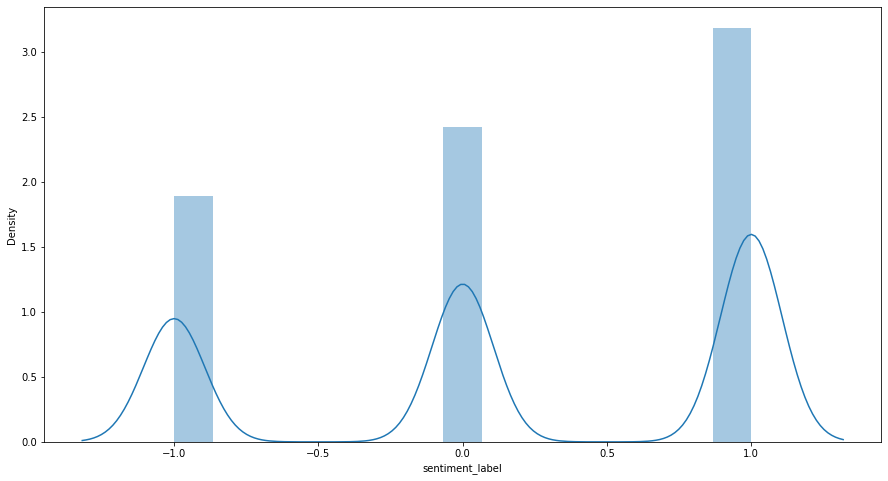

In [106]:
#sentence polarity of overall data
plt.figure(figsize=(15,8))
sns.distplot(cust_data['sentiment_label'])

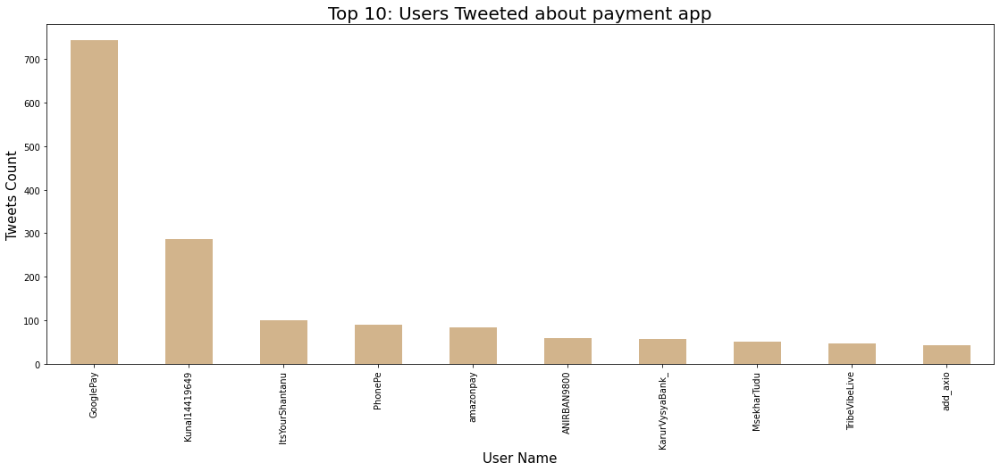

In [107]:
# checking the top 10 sources
cust_data.username.value_counts().head(10).plot.bar(figsize = (19, 7), color = ('tan'))
plt.title('Top 10: Users Tweeted about payment app', fontsize = 20)
plt.xlabel('User Name', fontsize = 15)
plt.ylabel('Tweets Count', fontsize = 15)
plt.show()

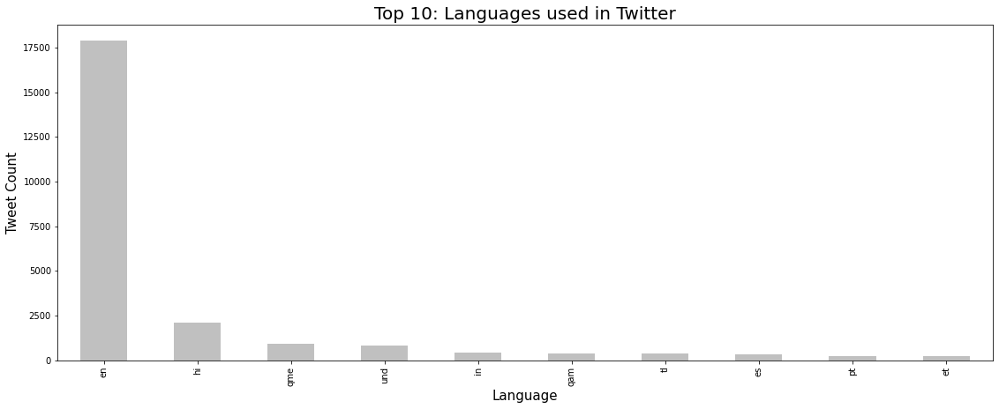

In [108]:
# Top 10 language used for tweet
cust_data.language.value_counts().head(10).plot.bar(figsize = (19, 7), color = ('silver'))
plt.title('Top 10: Languages used in Twitter', fontsize = 20)
plt.xlabel('Language', fontsize = 15)
plt.ylabel('Tweet Count', fontsize = 15)
plt.show()

##BRAND ANALYTICS

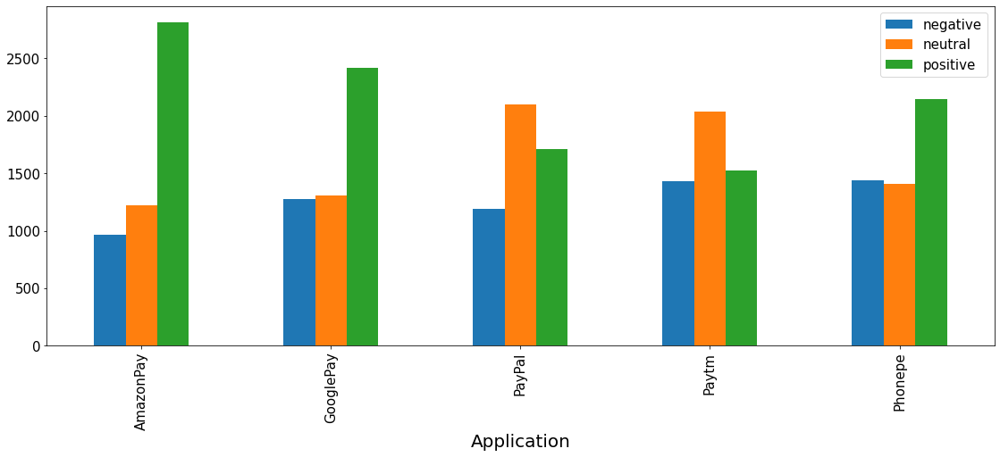

In [109]:
#Plotting review distribution in top-5 brands
top_5 = cust_data['application'].value_counts()
top_5 = list(top_5.index)
top_5 = cust_data[cust_data['application'].isin(top_5)]

review = top_5.groupby(['application','sentiment']).sentiment.count().unstack()


plot = review.plot(kind='bar',figsize = (19, 7))
plot.set_xlabel('Application', fontsize=20)
plot.set_ylabel("",fontsize=15)

plot.tick_params(axis="x", labelsize=15)
plot.tick_params(axis="y", labelsize=15)
plot.legend(fontsize=15)


#Most positive reviews for Phonepe

In [110]:
most_positive1 = phonepe[phonepe.sentiment == 'positive'].clean_text.head()
pos_txt1 = list(most_positive1)
pos1 = phonepe[phonepe.sentiment == 'positive'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Positive Replies on phonepe Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()


#Most positive reviews for AmazonPay

In [112]:
most_positive1 = amazonpay[amazonpay.sentiment == 'positive'].clean_text.head()
pos_txt1 = list(most_positive1)
pos1 = amazonpay[amazonpay.sentiment == 'positive'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Positive Replies on amazonpay Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()


#Most positive reviews for Paytm

In [113]:
most_positive1 = paytm[paytm.sentiment== 'positive'].clean_text.head()
pos_txt1 = list(most_positive1)
pos1 = paytm[paytm.sentiment == 'positive'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Positive Replies on paytm Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()


#Most positive reviews for GooglePay

In [114]:
most_positive1 = googlepay[googlepay.sentiment== 'positive'].clean_text.head()
pos_txt1 = list(most_positive1)
pos1 = googlepay[googlepay.sentiment == 'positive'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Positive Replies on googlepay Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()

#Most positive reviews for PayPal


In [115]:
most_positive1 = paypal[paypal.sentiment == 'positive'].clean_text.head()
pos_txt1 = list(most_positive1)
pos1 = paypal[paypal.sentiment == 'positive'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Positive Replies on PayPal Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()



#Most negative reviews for Phonepe

In [116]:
most_negative = phonepe[phonepe.sentiment == 'negative'].clean_text.head()
pos_txt1 = list(most_negative)
pos1 = phonepe[phonepe.sentiment == 'negative'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Negative Replies on phonepe Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()

#Most negative reviews for AmazonPay

In [117]:
most_negative = amazonpay[amazonpay.sentiment == 'negative'].clean_text.head()
pos_txt1 = list(most_negative)
pos1 = amazonpay[amazonpay.sentiment == 'negative'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Negative Replies on amazonpay Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()


#Most negative reviews for Paytm

In [118]:
most_negative = paytm[paytm.sentiment == 'negative'].clean_text.head()
pos_txt1 = list(most_negative)
pos1 = paytm[paytm.sentiment == 'negative'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Negative Replies on paytm Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()

#Most negative reviews for GooglePay

In [119]:
most_negative = googlepay[googlepay.sentiment == 'negative'].clean_text.head()
pos_txt1 = list(most_negative)
pos1 = googlepay[googlepay.sentiment == 'negative'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Negative Replies on googlepay Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()

#Most negative reviews for PayPal

In [120]:
most_negative = paypal[paypal.sentiment == 'negative'].clean_text.head()
pos_txt1 = list(most_negative)
pos1 = paypal[paypal.sentiment == 'negative'].sentiment.head()
pos_pol1 = list(pos1)

fig = go.Figure(data=[go.Table(columnorder = [1,2], 
                               columnwidth = [50,400],
                               header=dict(values=['Polarity','Most Negative Replies on PayPal Handle'],
                               fill_color='paleturquoise',
                               align='left'),
               cells=dict(values=[pos_pol1, pos_txt1],
                               fill_color='lavender',
                               align='left'))])
fig.show()

#Creating wordcloud to understand most used words in tweets


In [121]:
#Word cloud for reviews

def plot_wordcloud(data,type,color,brand):
  reviews = data
  title = 'Word Cloud for ' +  type +  ' tweets for '+ brand
  stopwords = set(STOPWORDS)
  cloud_plot = WordCloud(background_color = color , stopwords = stopwords, width = 1200, height = 800).generate(str(reviews['clean_text']))
  plt.rcParams['figure.figsize'] = (20, 20)
  plt.axis('off')
  plt.imshow(cloud_plot,interpolation = 'bilinear')
  plt.title(title, fontsize = 40)
  plt.show()

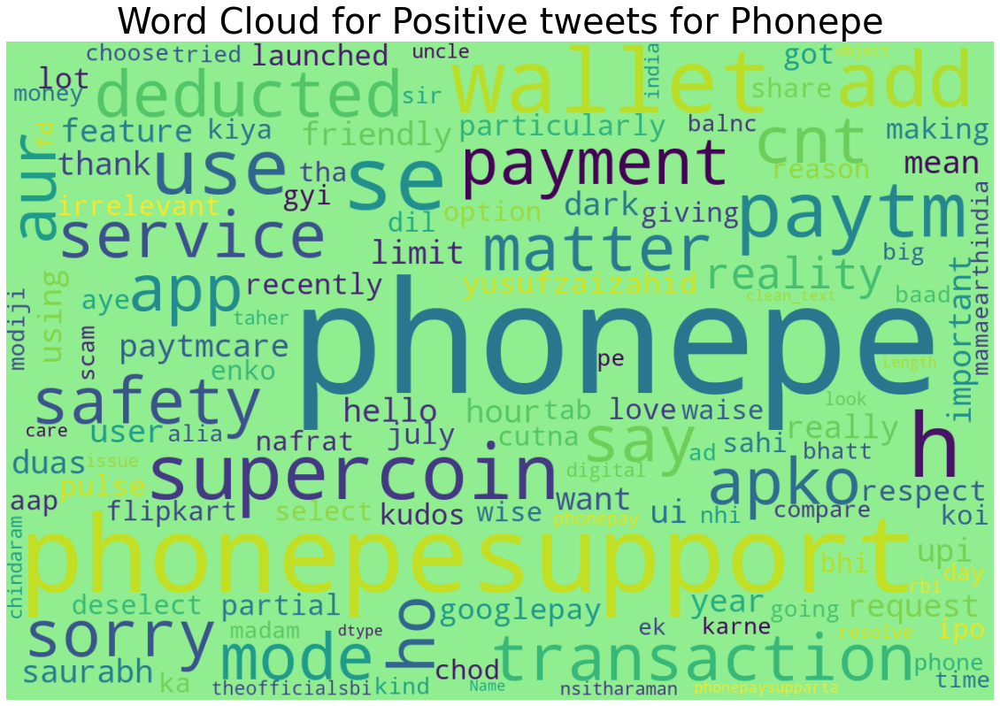

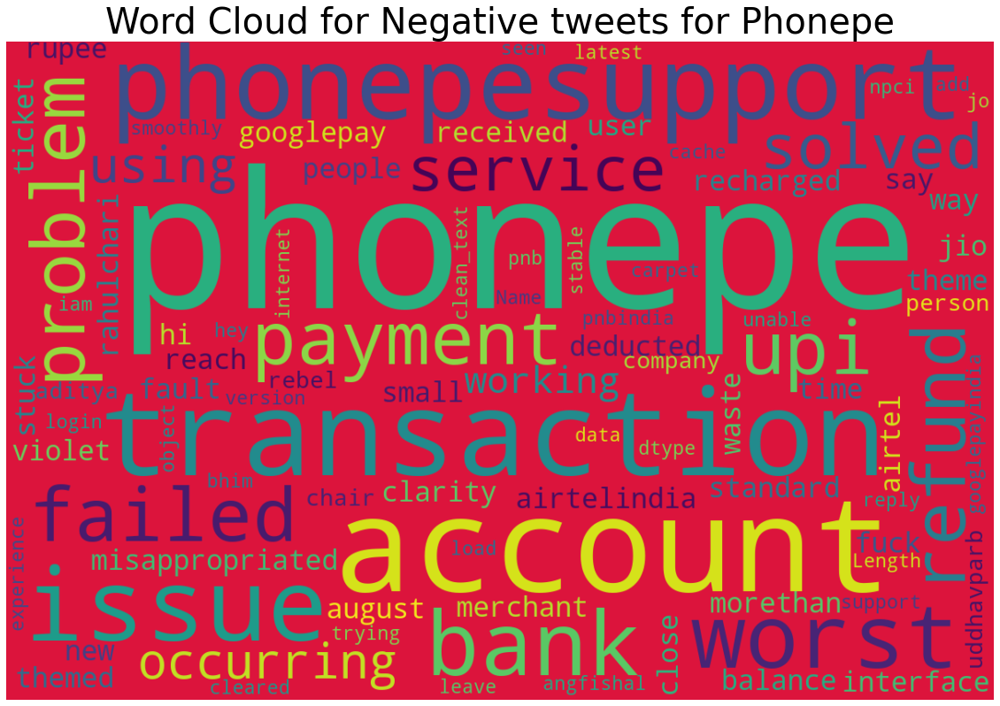

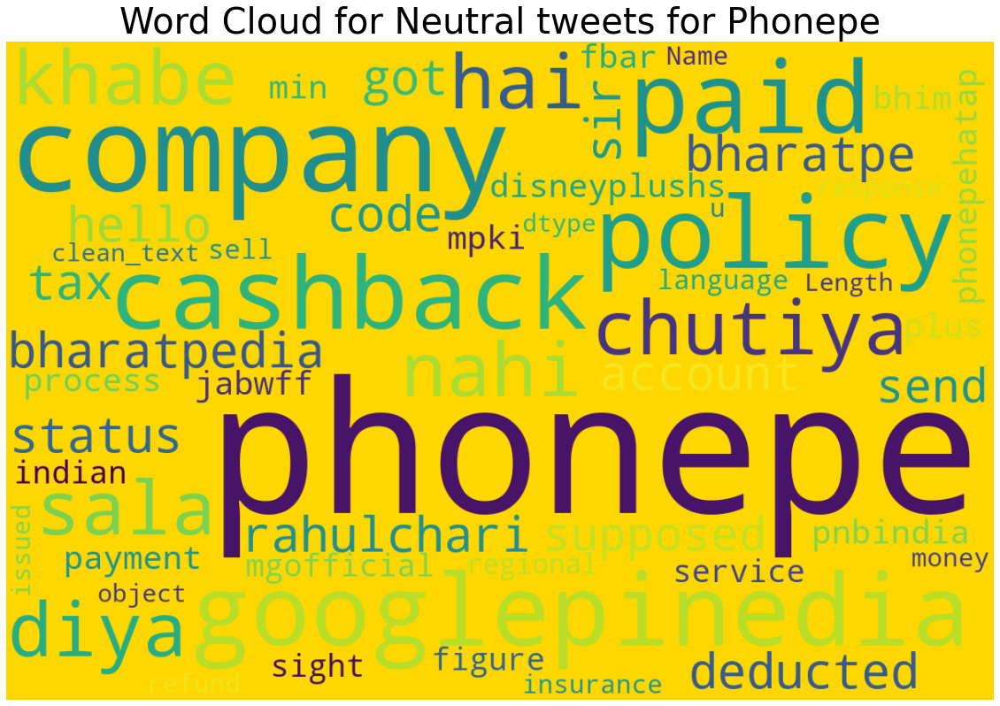

In [122]:
#subsetting the data based on reviews for plotting world cloud
positive_reviews = phonepe[phonepe['sentiment'] == 'positive']; 
negative_reviews = phonepe[phonepe['sentiment'] == 'negative']; 
neutral_reviews = phonepe[phonepe['sentiment'] == 'neutral'];

#Word cloud for positive reviews
plot_wordcloud(positive_reviews,"Positive",'lightgreen','Phonepe')

#Word cloud for negative reviews
plot_wordcloud(negative_reviews,"Negative",'crimson','Phonepe')

#Word cloud for neutral reviews
plot_wordcloud(neutral_reviews,"Neutral",'gold','Phonepe')

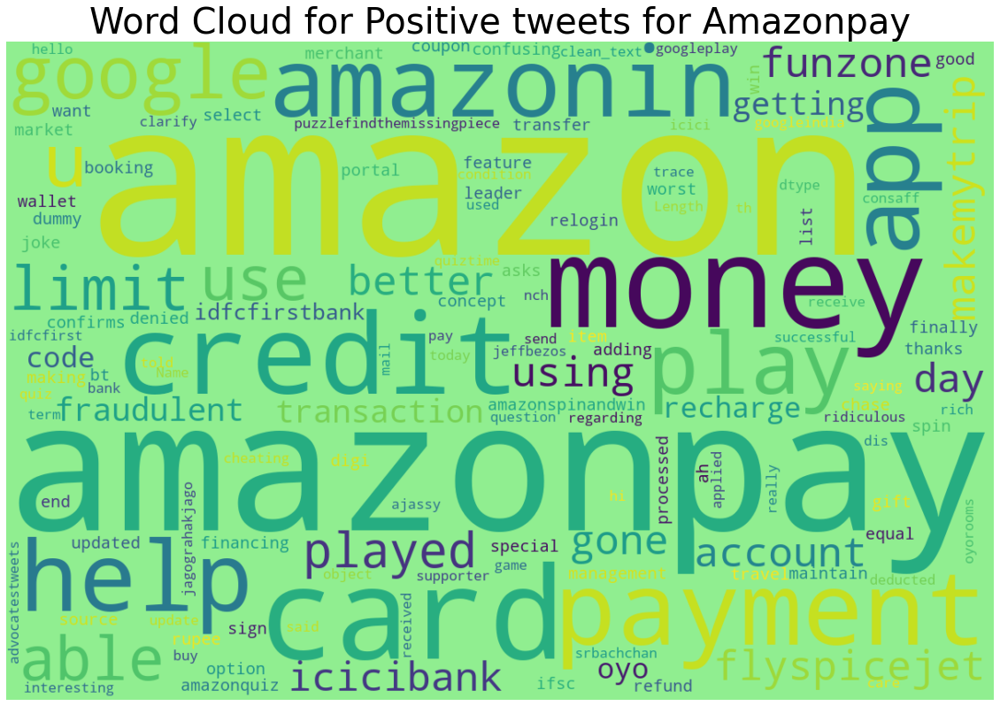

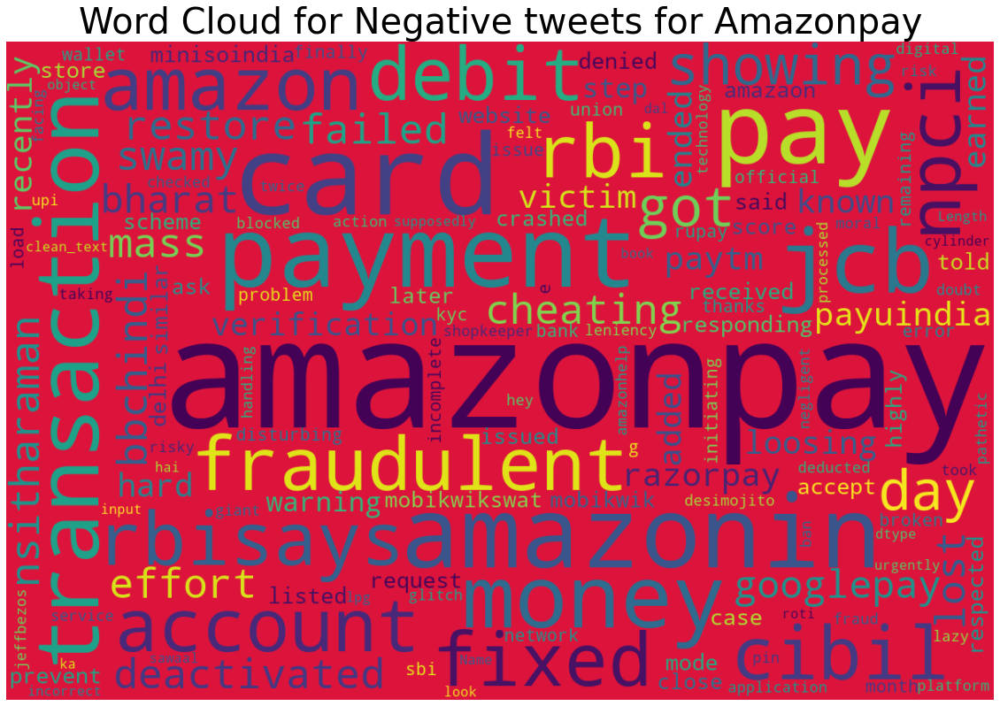

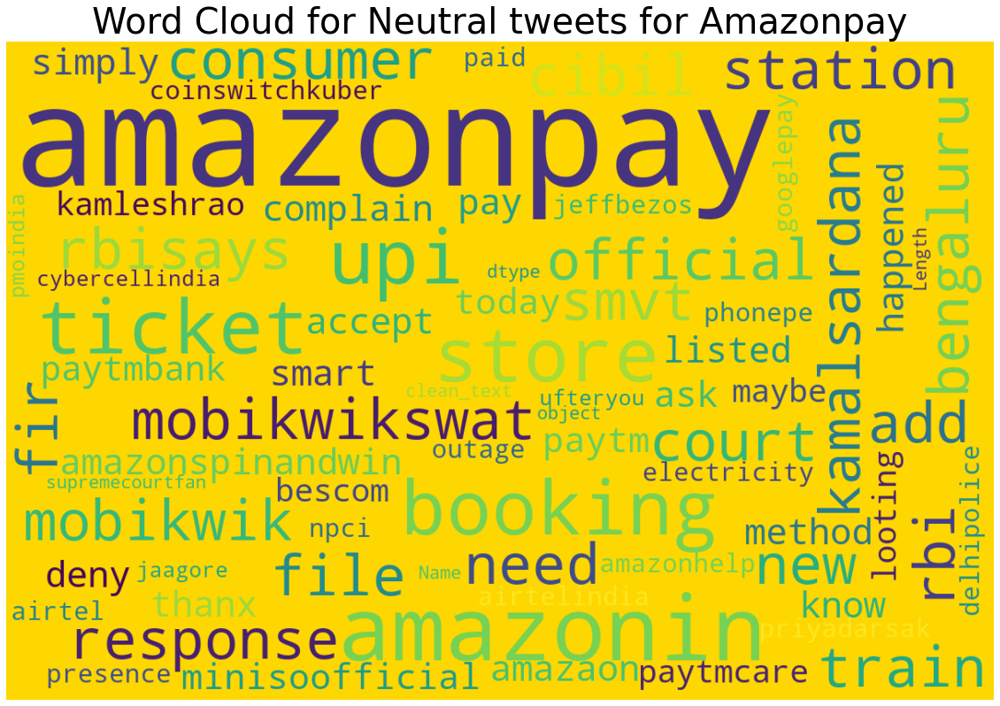

In [123]:
#subsetting the data based on reviews for plotting world cloud
positive_reviews = amazonpay[amazonpay['sentiment'] == 'positive']; 
negative_reviews = amazonpay[amazonpay['sentiment'] == 'negative']; 
neutral_reviews = amazonpay[amazonpay['sentiment'] == 'neutral'];

#Word cloud for positive reviews
plot_wordcloud(positive_reviews,"Positive",'lightgreen','Amazonpay')

#Word cloud for negative reviews
plot_wordcloud(negative_reviews,"Negative",'crimson','Amazonpay')

#Word cloud for neutral reviews
plot_wordcloud(neutral_reviews,"Neutral",'gold','Amazonpay')

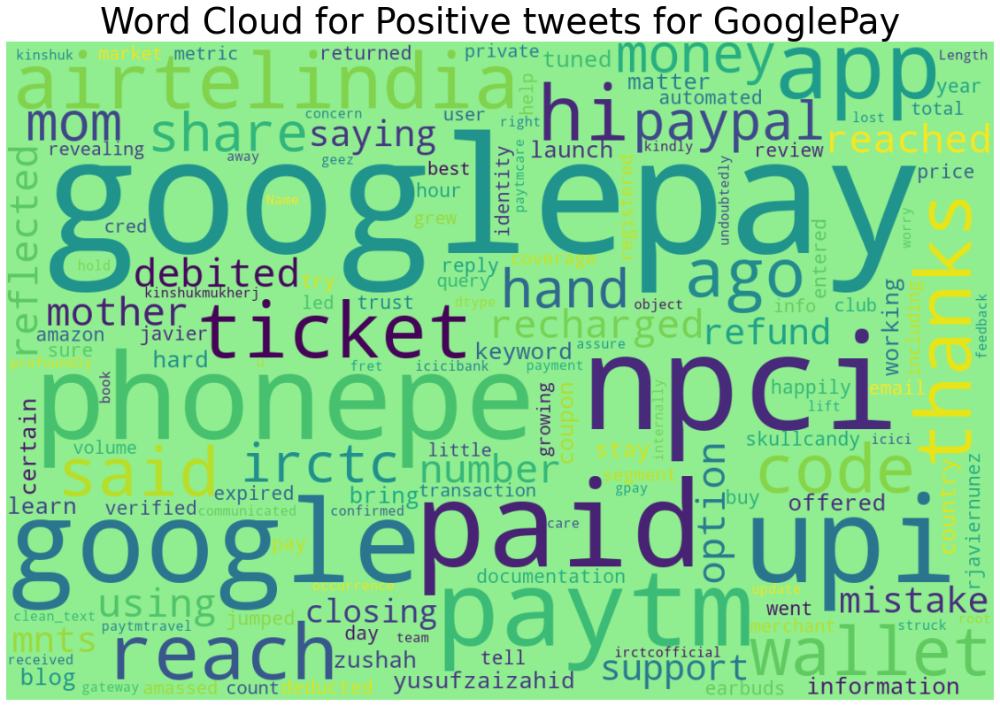

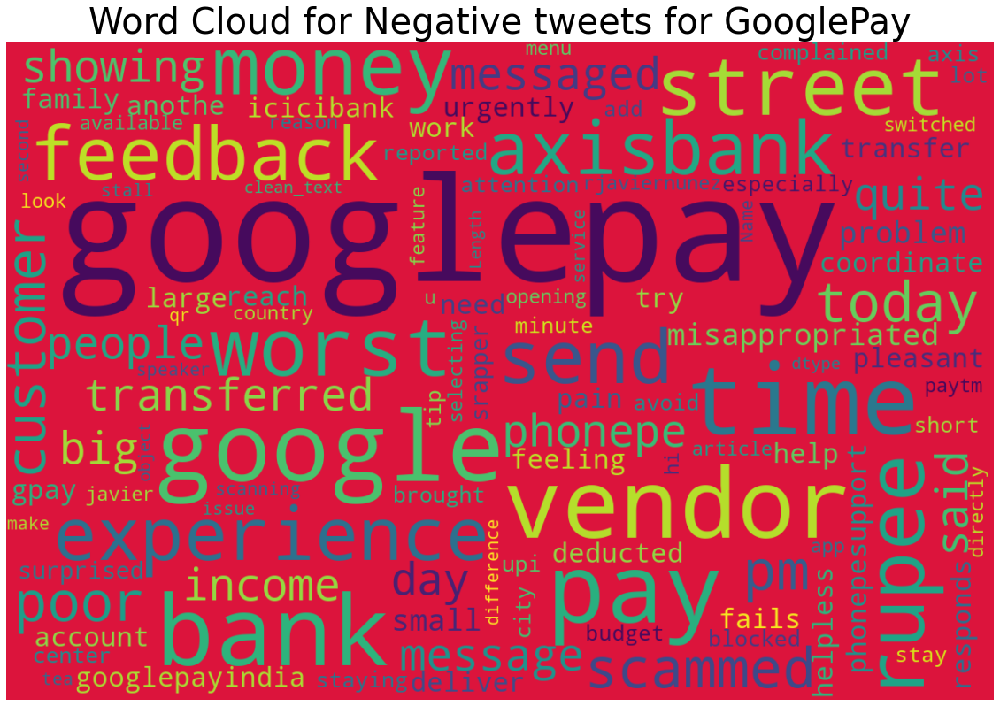

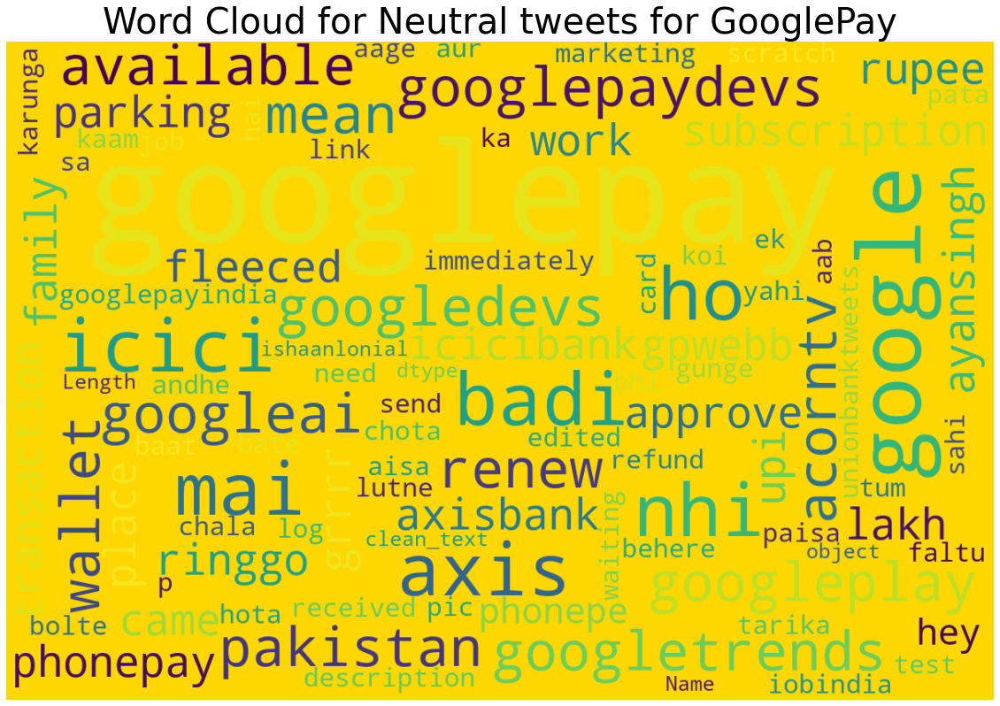

In [124]:
#subsetting the data based on reviews for plotting world cloud
positive_reviews = googlepay[googlepay['sentiment'] == 'positive']; 
negative_reviews = googlepay[googlepay['sentiment'] == 'negative']; 
neutral_reviews = googlepay[googlepay['sentiment'] == 'neutral'];

#Word cloud for positive reviews
plot_wordcloud(positive_reviews,"Positive",'lightgreen','GooglePay')

#Word cloud for negative reviews
plot_wordcloud(negative_reviews,"Negative",'crimson','GooglePay')

#Word cloud for neutral reviews
plot_wordcloud(neutral_reviews,"Neutral",'gold','GooglePay')

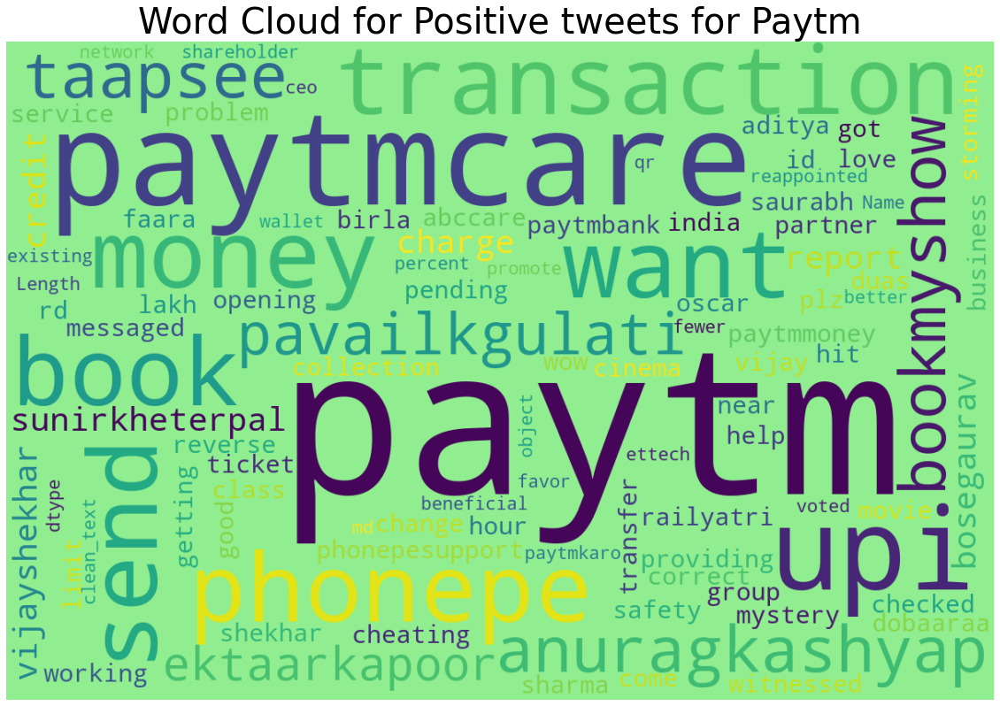

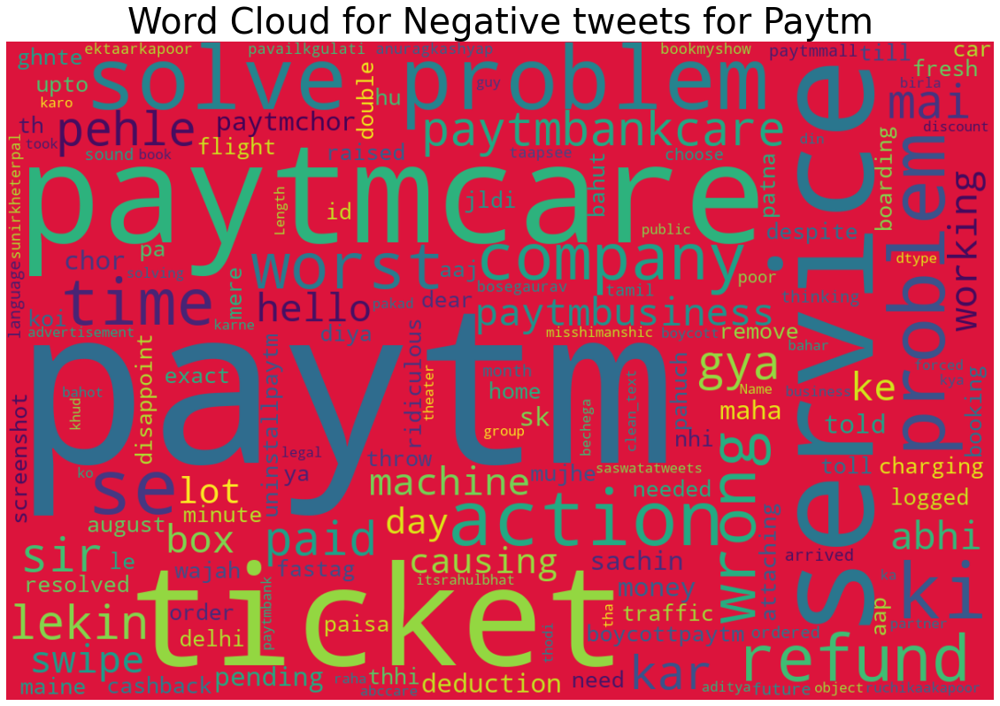

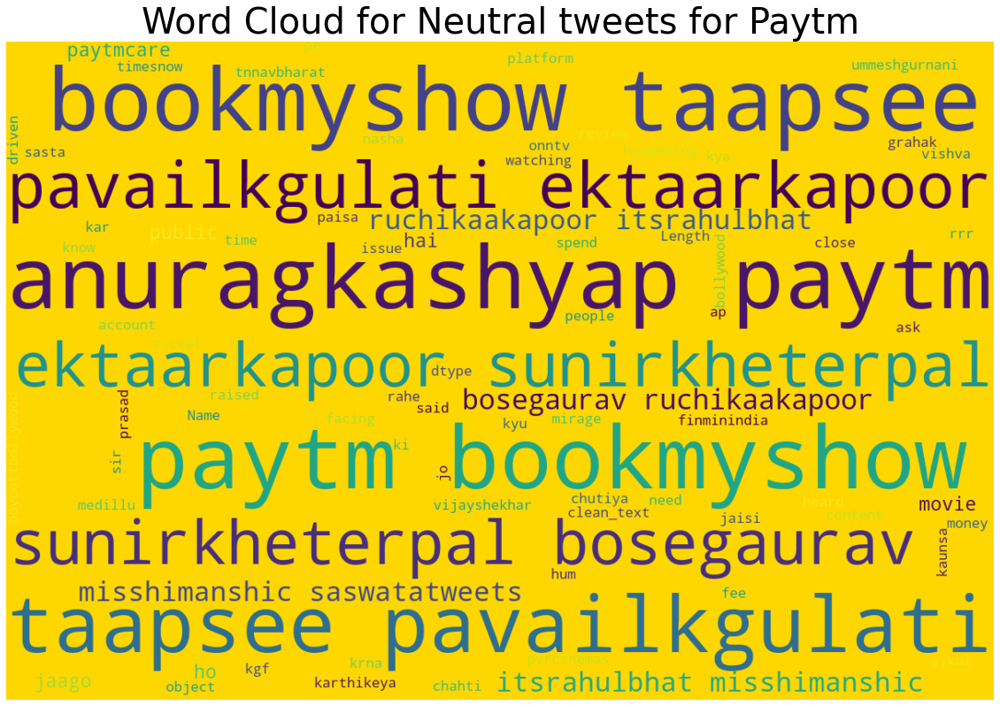

In [125]:
#subsetting the data based on reviews for plotting world cloud
positive_reviews = paytm[paytm['sentiment'] == 'positive']; 
negative_reviews = paytm[paytm['sentiment'] == 'negative']; 
neutral_reviews = paytm[paytm['sentiment'] == 'neutral'];

#Word cloud for positive reviews
plot_wordcloud(positive_reviews,"Positive",'lightgreen','Paytm')

#Word cloud for negative reviews
plot_wordcloud(negative_reviews,"Negative",'crimson','Paytm')

#Word cloud for neutral reviews
plot_wordcloud(neutral_reviews,"Neutral",'gold','Paytm')

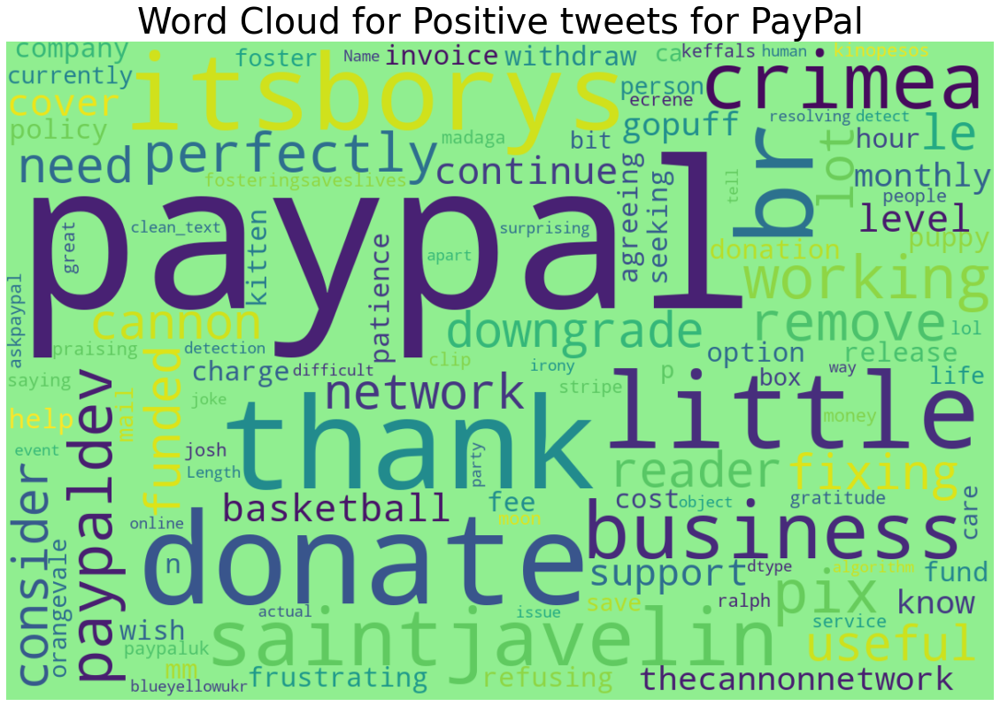

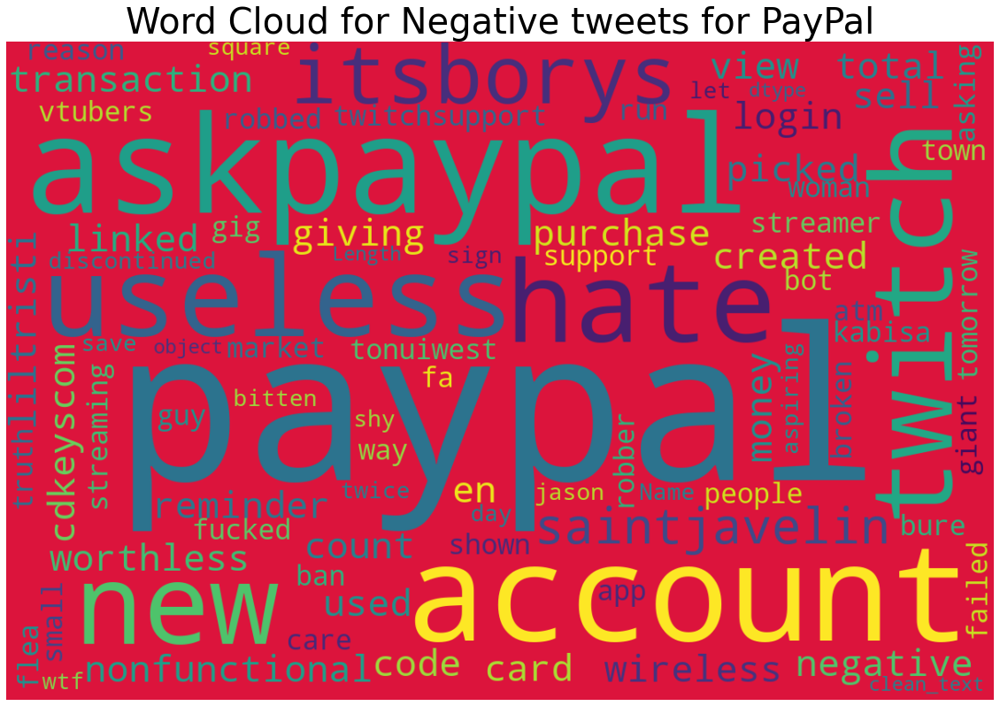

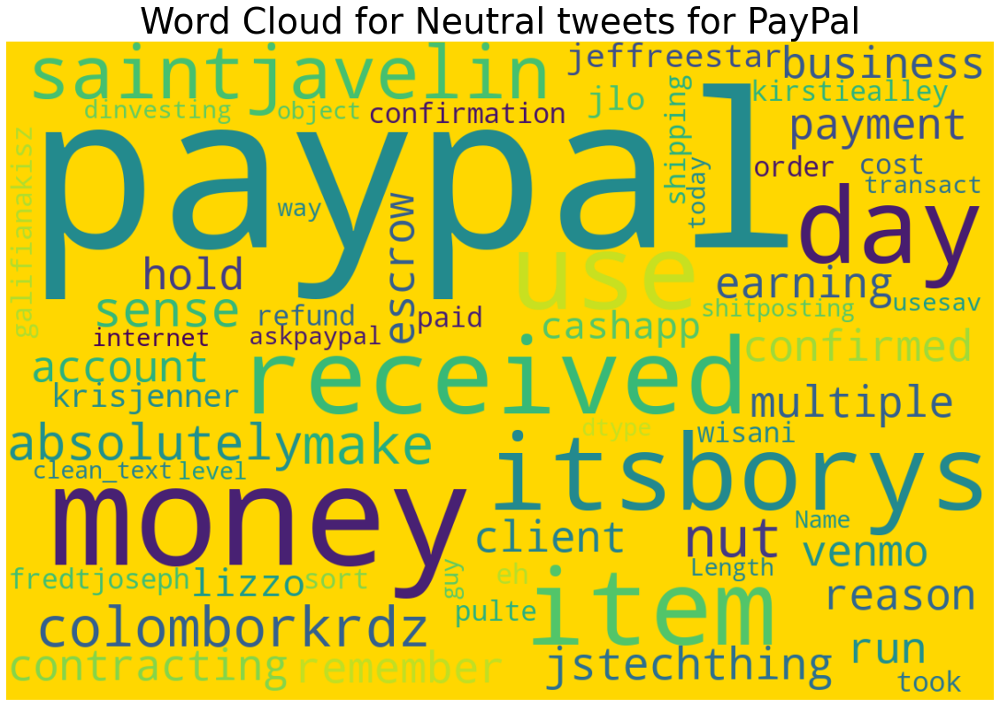

In [126]:
#subsetting the data based on reviews for plotting world cloud
positive_reviews = paypal[paypal['sentiment'] == 'positive']; 
negative_reviews = paypal[paypal['sentiment'] == 'negative']; 
neutral_reviews = paypal[paypal['sentiment'] == 'neutral'];

#Word cloud for positive reviews
plot_wordcloud(positive_reviews,"Positive",'lightgreen','PayPal')

#Word cloud for negative reviews
plot_wordcloud(negative_reviews,"Negative",'crimson','PayPal')

#Word cloud for neutral reviews
plot_wordcloud(neutral_reviews,"Neutral",'gold','PayPal')

#Location analysis

In [127]:
location_df=cust_data[['application','location']]
location_df['location_str'] = location_df['location'].str.lower()


location_list = ['Mumbai', 'Delhi', 'Bengaluru','Bangalore', 'Hyderabad', 'Ahmedabad', 'Chennai', 'Kolkata', 'Surat', 'Pune', 'Kanpur', 'Jaipur', 'Jharkhand', 'Lucknow', 'Nagpur', 'Coimbatore', 'Indore', 'Vadodara', 'Kallakurichi', 'Patna', 'Bhopal', 'Ludhiana', 'Madurai', 'Tirunelveli', 'Agra', 'Rajkot', 'Najafgarh', 'Jamshedpur', 'Gorakhpur', 'Nashik', 'Pimpri', 'Kalyan', 'Thane', 'Meerut', 'Nowrangapur', 'Faridabad', 'Ghaziabad', 'Dhanbad', 'Dombivli', 'Varanasi', 'Ranchi', 'Amritsar', 'Allahabad', 'Visakhapatnam', 'Teni', 'Jabalpur', 'Haora', 'Tiruchirappalli', 'Aurangabad', 'Shivaji Nagar', 'Solapur', 'Srinagar', 'Tiruppur', 'Chandigarh', 'Jodhpur', 'Salem', 'Guwahati', 'Gwalior', 'Vijayawada', 'Mysore', 'Rohini', 'Hubli', 'Narela', 'Jalandhar', 'Thiruvananthapuram', 'Kota', 'Bhubaneshwar', 'Aligarh', 'Bareilly', 'Moradabad', 'Bhiwandi', 'Raipur', 'Gorakhpur', 'Puducherry', 'Bhilai', 'Borivli', 'Bhavnagar', 'Cochin', 'Amravati', 'Sangli', 'Cuttack', 'Bikaner', 'Bokaro', 'Warangal', 'Nanded', 'Kozhikode', 'Raurkela', 'Guntur', 'Dehra Dun', 'Erode', 'Bhayandar', 'Durgapur', 'Ajmer', 'Ulhasnagar', 'Kolhapur', 'Siliguri', 'Bilimora', 'Karol Bagh', 'Asansol', 'Jamnagar', 'Saharanpur', 'Vellore', 'Gulbarga', 'Bhatpara', 'Jammu', 'Kurnool', 'Ujjain', 'Ramgundam', 'Maheshtala', 'Shyamnagar', 'Malegaon', 'Davangere', 'Jalgaon', 'Akola', 'Belgaum', 'Rajpur Sonarpur', 'Gaya', 'Udaipur', 'Korba', 'Mangalore', 'Jhansi', 'Thoothukudi', 'Nellore', 'Panihati', 'Rajahmundry', 'Ahmadnagar', 'Kollam', 'Dhulia', 'Bhagalpur', 'Punasa', 'Muzaffarnagar', 'Latur', 'Kukatpalli', 'Ambattur', 'Bellary', 'Muzaffarpur', 'Kamarhati', 'Mathura', 'Patiala', 'Chanda', 'Bhilwara', 'Brahmapur', 'Shahjanpur', 'Shimoga', 'Rohtak', 'Thrissur', 'Tumkur', 'Firozabad', 'Nizamabad', 'Kulti', 'Barddhaman', 'Barasat', 'Mulugu', 'Bali', 'Hisar', 'Rampur', 'Greater Noida', 'Noida', 'Kakinada', 'Panipat', 'Dindigul', 'Tanjore', 'Parbhani', 'Darbhanga', 'Alwar', 'Bilaspur', 'Ichalkaranji', 'Bijapur', 'Aizawl', 'Ranipet', 'Jalna', 'Lal Bahadur Nagar', 'Dewas', 'Baranagar', 'Gajuwaka', 'Satna', 'Etawah', 'Durg', 'Naihati', 'Tirupati', 'Sonipat', 'Avadi', 'Tiruvottiyur', 'Saugor', 'Mau', 'Bihar Sharif', 'Hapur', 'Bathinda', 'Farrukhabad', 'Alappuzha', 'Anantapur', 'Ratlam', 'Ramagundam', 'Sivakasi', 'Karur', 'Ooty', 'Ganganagar', 'Hosur', 'Bharatpur', 'Karimnagar', 'Shrirampur', 'Raichur', 'Quthbullapur', 'Karnal', 'Nagercoil', 'Arrah', 'Imphal', 'Gosaba', 'Kanchipuram', 'Mirzapur', 'Kharagpur', 'Amarnath', 'Pali', 'Yamunanagar', 'Rewa', 'Secunderabad', 'Bidar', 'Agartala', 'Monghyr', 'Deoghar', 'Burhanpur', 'Nadiad', 'Chapra', 'Gyanpur', 'Panchkula', 'Sikar', 'Bulandshahr', 'Purnia', 'Hospet', 'Gurgaon', 'Sambhal', 'Gandhinagar', 'Murwara', 'Kumarapalayam', 'Nangloi Jat', 'Machilipatnam', 'Katihar', 'Bhiwani', 'Raebareli', 'Haridwar', 'Singrauli', 'Phusro', 'Junagadh', 'Sujangarh', 'Ellore', 'Bhusaval', 'Khandwa', 'Bahraigh', 'Karaikkudi', 'Sirsa', 'Chandannagar', 'Baharampur', 'Surendranagar', 'Vizianagaram', 'Neyveli', 'Proddatur', 'Hugli', 'Amroha', 'Tambaram', 'Pathankot', 'Bhind', 'Cuddalore', 'Shimla', 'Ongole', 'Gadag-Betageri', 'Navsari', 'Puri', 'Haldia', 'Khammam', 'Raiganj', 'Ingraj Bazar', 'Jaunpur', 'Kumbakonam', 'Fatehpur', 'Gandhidham', 'Nandyal', 'Udupi', 'Loni', 'Sitapur', 'Shivpuri', 'Bhadravati', 'Adoni', 'Veraval', 'Sambalpur', 'Gadag', 'Unnao', 'Budaun', 'Jind', 'Madhyamgram', 'Jamuria', 'Jaigaon', 'Orai', 'Hoshiarpur', 'Pallavaram', 'Hanumangarh', 'Alandur', 'Guna', 'Bahadurgarh', 'Hazaribagh', 'Bharuch', 'Medinipur', 'Fyzabad', 'Dinapore', 'Silchar', 'Banda', 'Morena', 'Tonk', 'Raj-Nandgaon', 'Serilingampalle', 'Virar', 'Malkajgiri', 'Shantipur', 'Barakpur', 'Ambala', 'Krishnanagar', 'Saharsa', 'Batala', 'Bhimavaram', 'Balurghat', 'Kaithal', 'Lakhimpur', 'Vidisha', 'Haldwani', 'Habra', 'Porbandar', 'Chitradurga', 'Thanesar', 'Tiruvannamalai', 'Anand', 'Kanchrapara', 'Mahbubnagar', 'Dimapur', 'Robertsonpet', 'Chhindwara', 'Mandya', 'Bankura', 'Hajipur', 'Gonda City', 'Bhuj', 'Hindupur', 'Shillong', 'Palghat', 'Godhra', 'Kishangarh', 'Raniganj', 'Pilibhit', 'Beawar', 'Abohar', 'Moga', 'Dehri', 'Deoria', 'Hassan', 'Khardah', 'Yavatmal', 'Halisahar', 'Panvel', 'Titagarh', 'Cuddapah', 'Bettiah', 'Hathras', 'Lalitpur', 'Kolar', 'Mandsaur', 'Gondia', 'Rajapalaiyam', 'Darjiling', 'Mohali', 'Palanpur', 'Dam Dam', 'Hardoi', 'Puruliya', 'Dibrugarh', 'Palwal', 'Nalgonda', 'Bhadreswar', 'Vejalpur', 'Chikmagalur', 'Raigarh', 'Guntakal Junction', 'Gangapur', 'Deoli', 'Siwan', 'Damoh', 'Adilabad', 'Srikakulam', 'Uppal Kalan', 'Jetpur', 'Morbi', 'Patan', 'Khanna', 'Botad', 'Rishra', 'Azamgarh', 'Yelahanka', 'Gudivada', 'Baidyabati', 'Basti', 'Balasore', 'Dharmavaram', 'Maler Kotla']
location_list = [x.lower() for x in location_list]
split_list = '|'.join(location_list)
cust_data['location']=cust_data['location'].str.lower()
for location_name in location_list:
  #print(location_name)
  cust_data.loc[cust_data['location'].str.contains(location_name),'new_location'] = location_name 

cust_data.replace({'new_location':{'bengaluru':'bangalore'}},inplace=True)


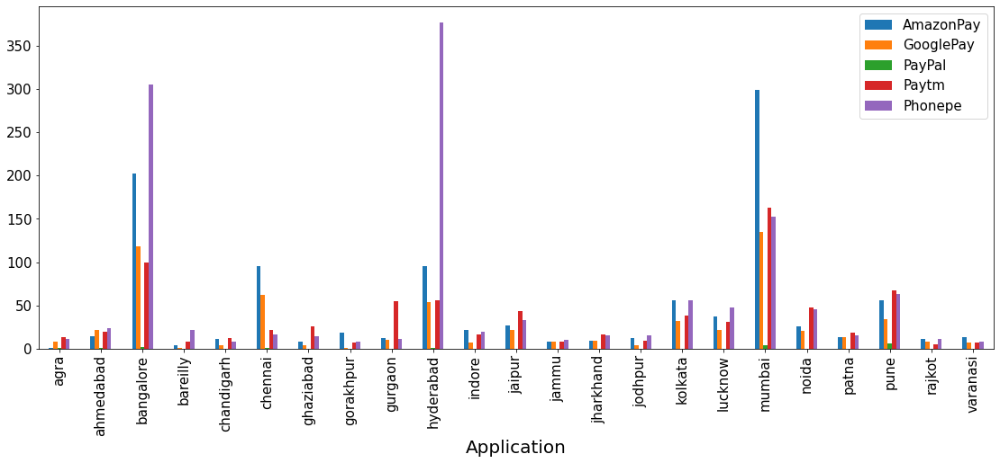

In [128]:
#Plotting location distribution in top-5 payment apps
top_5 = cust_data['new_location'].value_counts()
top_5 = top_5[1:24]
top_5 = list(top_5.index)
top_5 = cust_data[cust_data['new_location'].isin(top_5)]

review = top_5.groupby(['new_location','application']).application.count().unstack()


plot = review.plot(kind='bar',figsize = (19, 7))
plot.set_xlabel('Application', fontsize=20)
plot.set_ylabel("",fontsize=15)

plot.tick_params(axis="x", labelsize=15)
plot.tick_params(axis="y", labelsize=15)
plot.legend(fontsize=15)

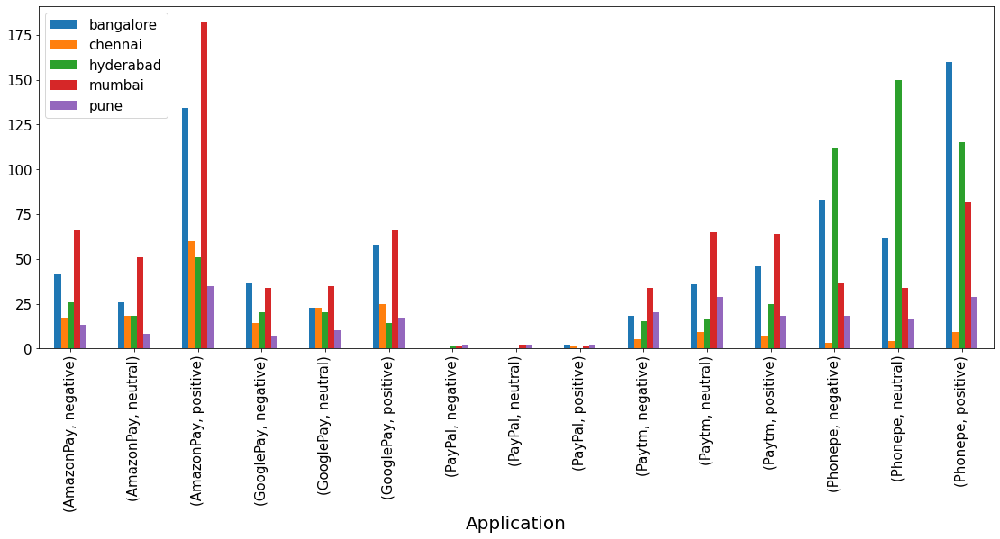

In [129]:
top_10= cust_data['new_location'].value_counts()
top_10=top_10[1:6]
top_10

top_10 = list(top_10.index)
top_10 = cust_data[cust_data['new_location'].isin(top_10)]


review = top_10.groupby(['application','sentiment','new_location']).new_location.count().unstack()

plot = review.plot(kind='bar',figsize = (19, 7))
plot.set_xlabel('Application', fontsize=20)
plot.set_ylabel("",fontsize=15)

plot.tick_params(axis="x", labelsize=15)
plot.tick_params(axis="y", labelsize=15)
plot.legend(fontsize=15)

# Hashtag Analysis


## TRENDING POSITIVE HASHTAGS

In [130]:
hash_df = cust_data[(cust_data['hashtags']!='nan')]

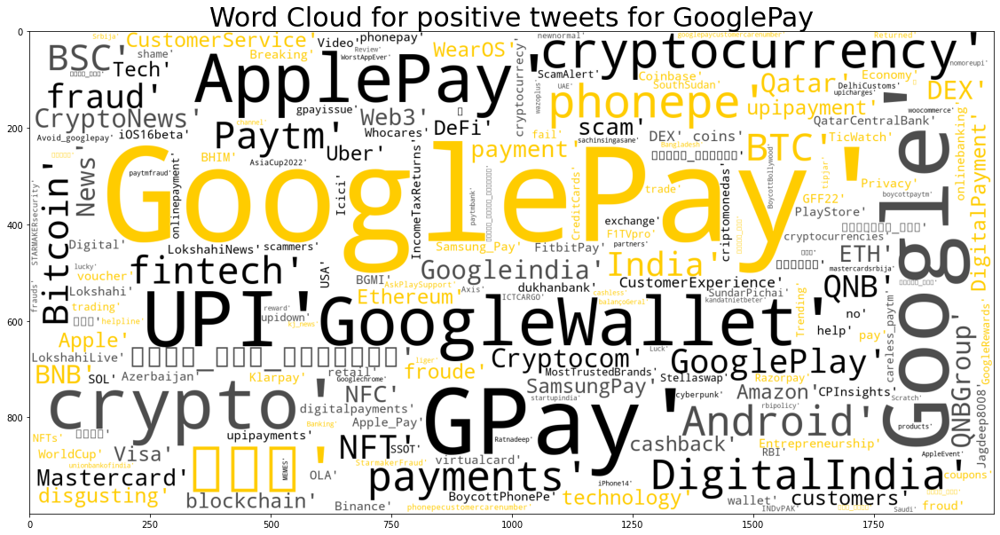

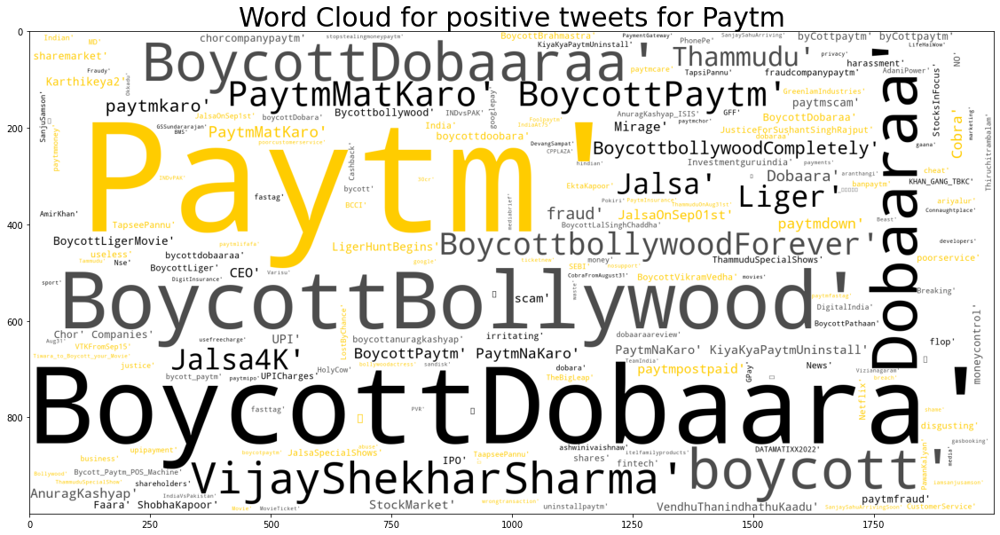

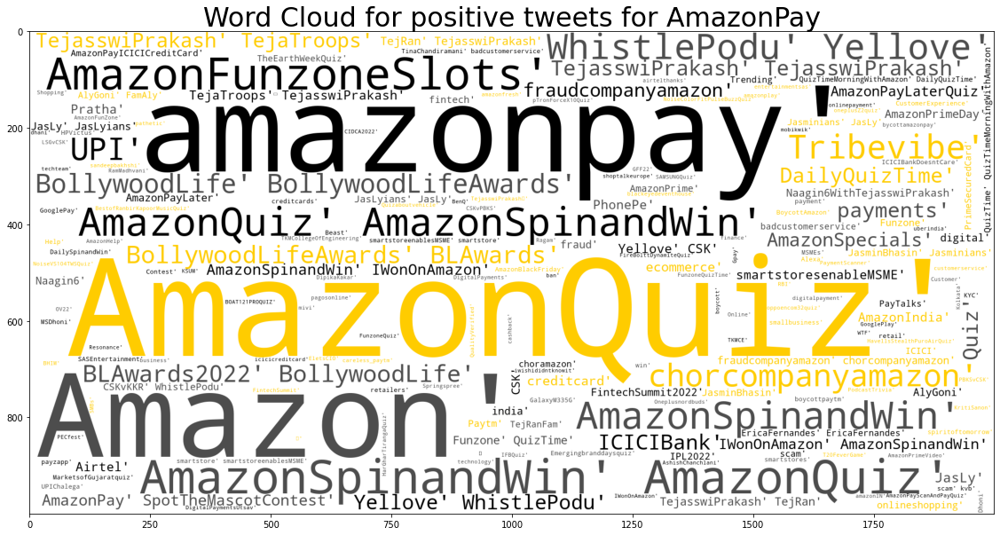

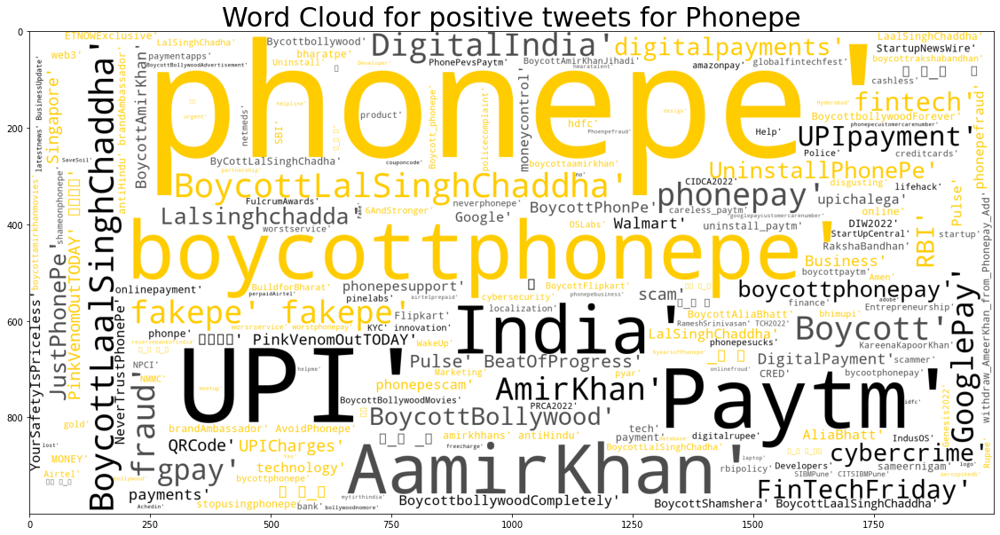

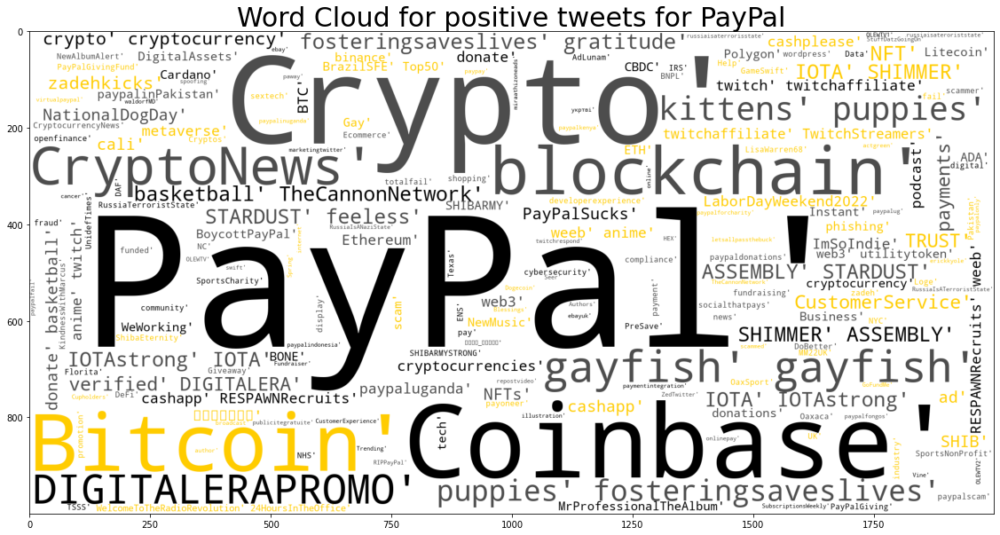

In [131]:
color_list=['#4d4d4d','#ffcc00','#000000',]
colormap=colors.ListedColormap(color_list)

def plot_wordcloud(data,type,color,brand):
  reviews = data
  title = 'Word Cloud for ' +  type +  ' tweets for '+ brand
  words = ' '.join([Text for Text in hash_df[hash_df['application']==brand]['hashtags']])
  wordCloud = WordCloud(background_color=color,colormap=colormap, mode="RGB", width=2000 , height=1000).generate(words)
  plt.figure(figsize=(20,10))
  plt.imshow(wordCloud)
  plt.title(title, fontsize = 30)
  plt.show()

app_list = ['GooglePay','Paytm','AmazonPay','Phonepe','PayPal']
for app in app_list:
   plot_wordcloud(cust_data,'positive','white',app)

##TRENDING NEGATIVE HASHTAGS

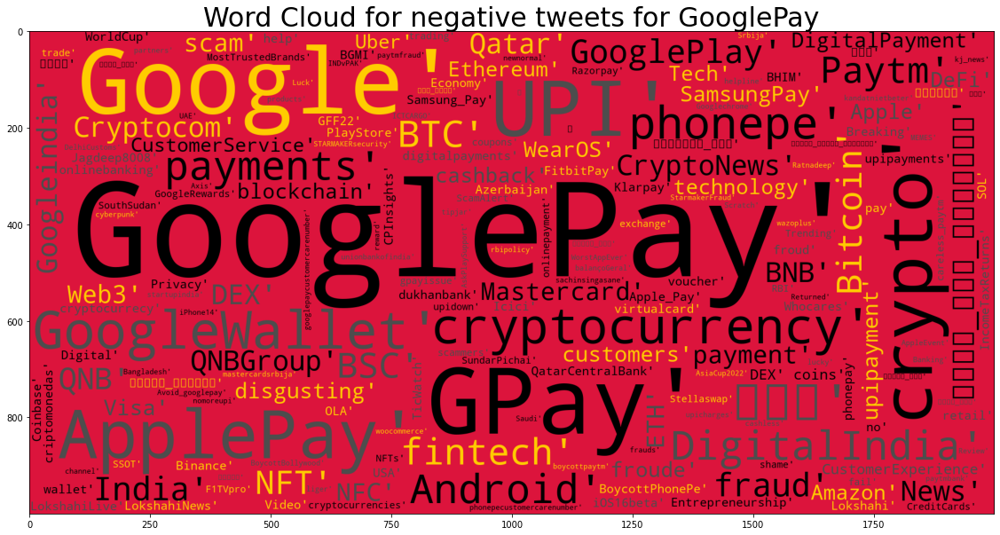

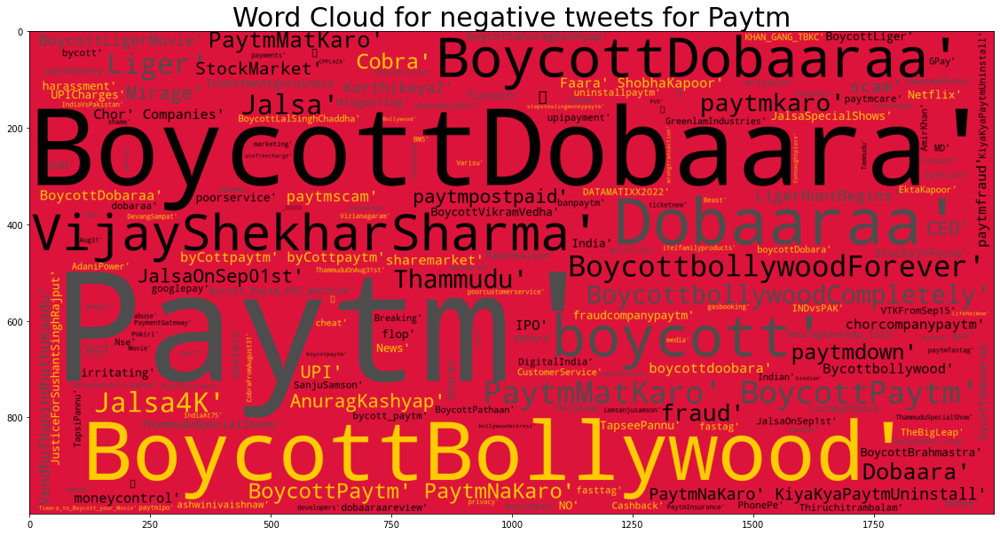

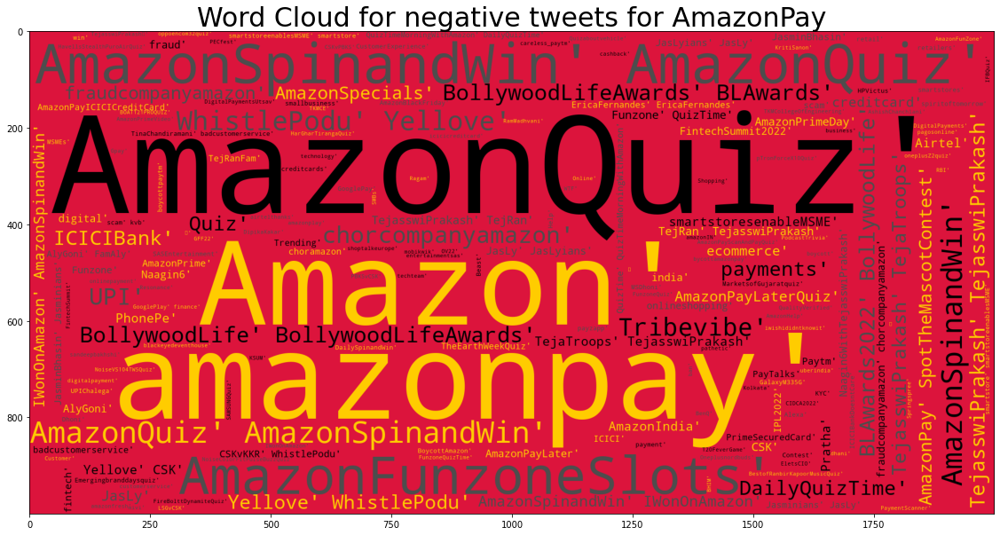

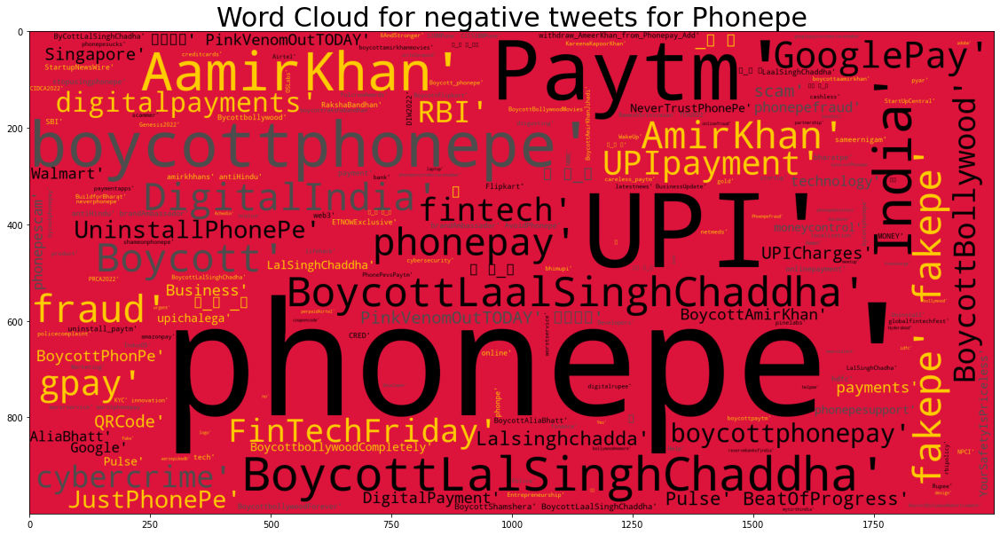

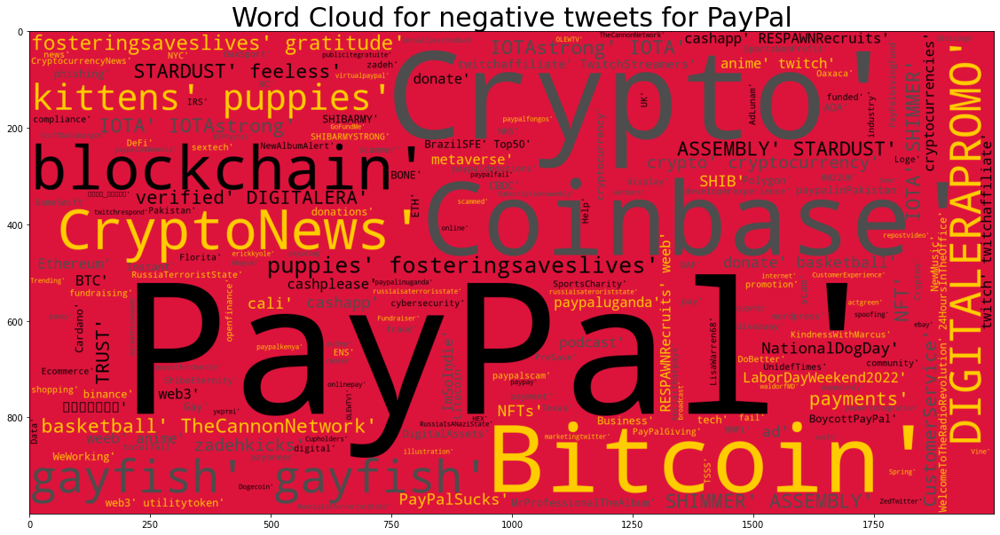

In [132]:
for app in app_list:
   plot_wordcloud(cust_data,'negative','crimson',app)

##TRENDING NEUTRAL HASHTAGS

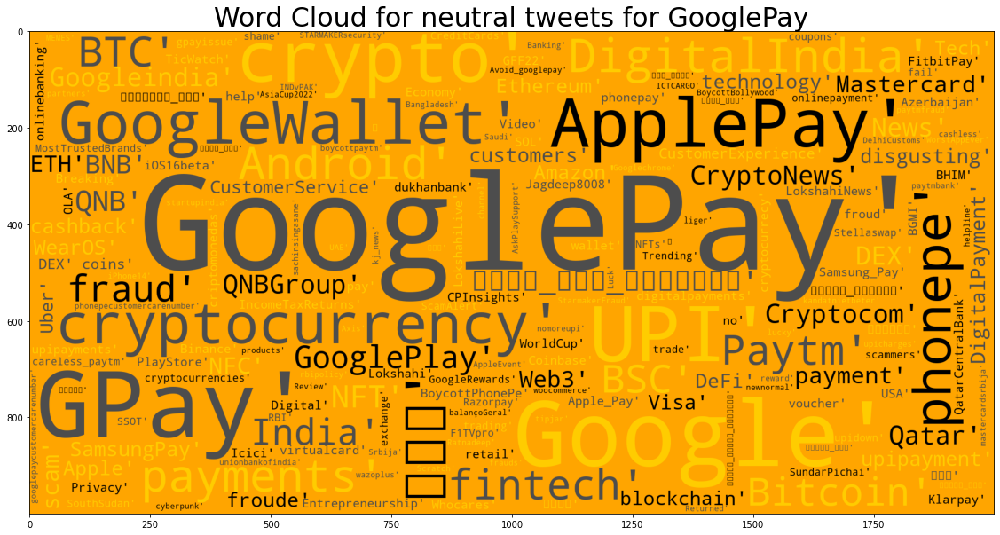

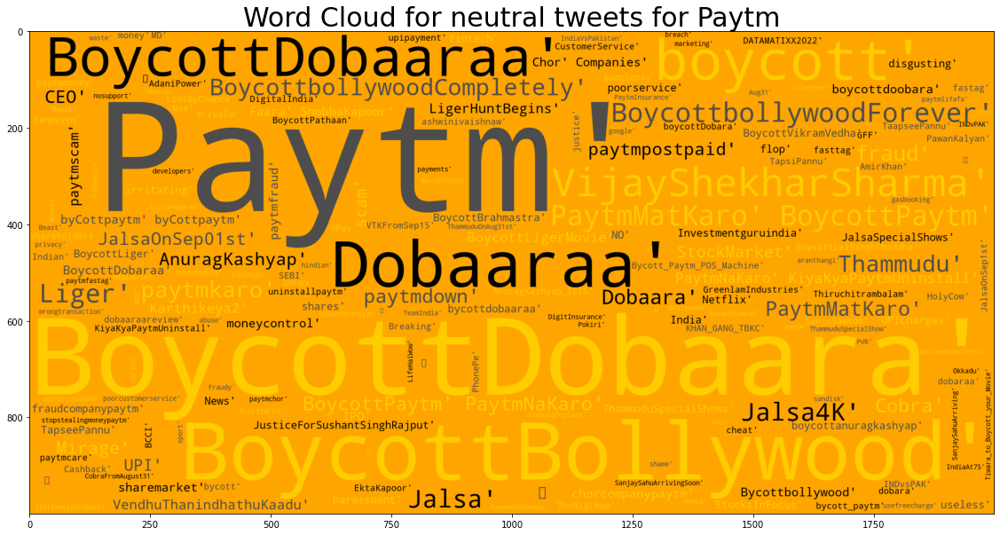

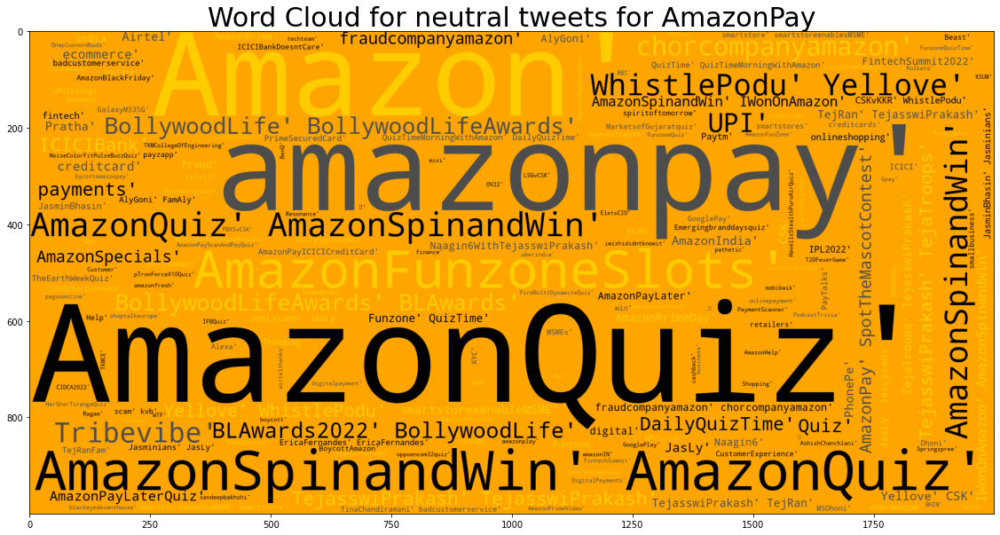

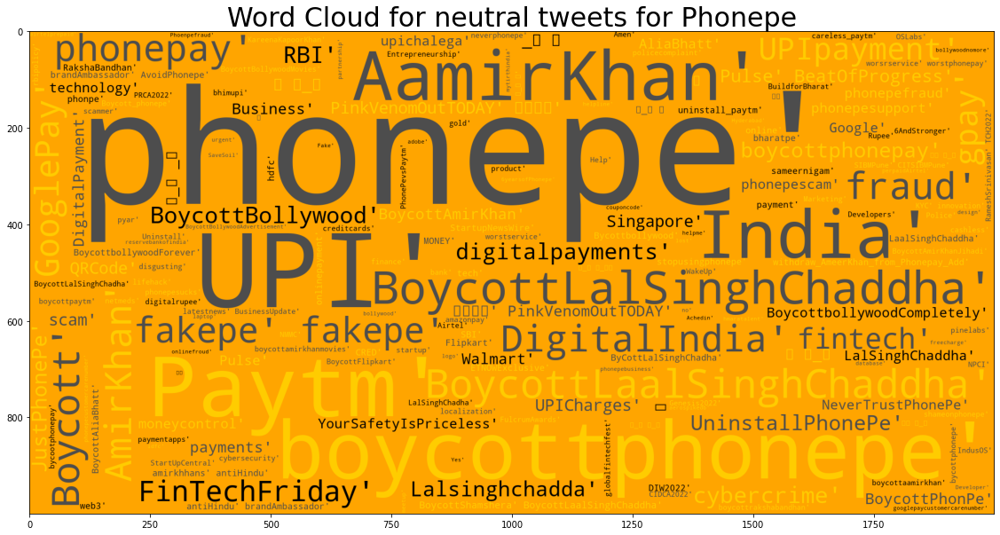

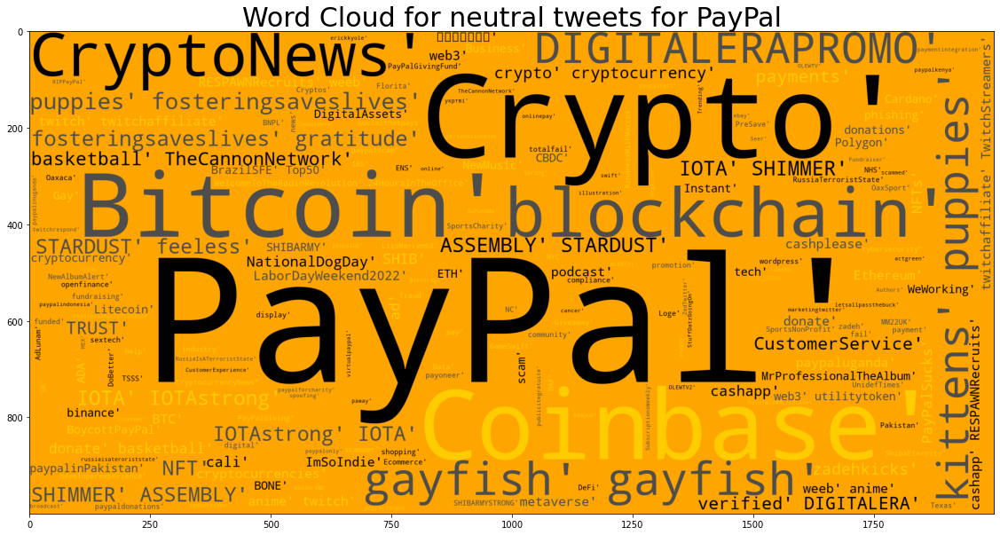

In [133]:
for app in app_list:
   plot_wordcloud(cust_data,'neutral','orange',app)

#Splitting the dataset into train and test

In [139]:
X_train, X_test, y_train, y_test = train_test_split(cust_data['clean_text'], cust_data['sentiment_label'], stratify = cust_data['sentiment_label'], test_size = 0.2,random_state=42);

#Model training

In [144]:
#text encoding function
#converting text into arrays by using the below function

def text_feature_extraction(X_train,X_test,vectorizer_type):
  if 'countvectorizer'== vectorizer_type:
    cv = CountVectorizer(token_pattern=r'\b\w+\b')
    cv.fit(X_train)
    train_data = cv.transform(X_train)
    test_data = cv.transform(X_test)
    return(train_data,test_data,vectorizer_type)
  elif 'tfidf'== vectorizer_type:
    tf_idf_vectorizer = TfidfVectorizer()
    train_data = tf_idf_vectorizer.fit_transform(X_train)
    test_data = tf_idf_vectorizer.transform(X_test)
    return(train_data,test_data,vectorizer_type)  
  elif 'ngram_countvectorizer' == vectorizer_type:
    count_ngram_vectorizer = CountVectorizer(binary=True, ngram_range=(1, 2))
    train_data = count_ngram_vectorizer.fit_transform(X_train)
    test_data = count_ngram_vectorizer.transform(X_test)
    return(train_data,test_data,vectorizer_type)


#classification algorithms function
accuracy_list = []
def  classification_algorithm(X_train,X_test,y_train,y_test,algorithm_type,vectorizer_type):
  if algorithm_type == 'knn':
    tuning_parameter  = [3,5,7] #knn tuning parameter in number of neighbours
    for value in tuning_parameter:
      knn = KNeighborsClassifier(n_neighbors= value)
      knn.fit(X_train, y_train)
      knn_pred = knn.predict(X_test)
      key = 'knn with ' + str(value) + ' neighbours ' + '(' + vectorizer_type + ')'
      value = accuracy_score(y_test, knn_pred)
      accuracy_list.append({'algorithm':key,'accuracy': value})  
     # print("Accuracy for K-nearest neighbour model with tuning parameter",value,"- \n{}\n".format(accuracy_score(y_test, knn_pred)))
      print("Classification report for K-nearest neighbour model with tuning parameter",value,"- \n{}:\n{}\n".format(knn, classification_report(y_test, knn_pred)))

  elif algorithm_type == 'logistic_regression':
    tuning_parameter = [0.01, 0.05, 0.25, 0.5, 1] # logistic regression tuning paramater is penality.
    for value in tuning_parameter:
      log = LogisticRegression(C=value)
      log.fit(X_train,y_train)
      log_pred = log.predict(X_test)
      key = 'logistic regression with penality ' + str(value) + '  ' + '(' + vectorizer_type + ')'
      value = accuracy_score(y_test, log_pred)
      accuracy_list.append({'algorithm':key,'accuracy': value})  
      print("Classification report for logistic regression model with tuning parameter",value,"- \n{}:\n{}\n".format(log,classification_report(y_test,log_pred)))

  elif algorithm_type == 'linearsvc':
    tuning_parameter = [0.01, 0.05, 0.25, 0.5, 1, 1.5, 2, 2.5, 3] #svm tuning parameter is penality
    for value in tuning_parameter: 
      svm = LinearSVC(C=value,max_iter=100)
      svm.fit(X_train, y_train)
      svm_pred = svm.predict(X_test)
      key = 'SVM with regularization parameter ' + str(value) + '  ' + '(' + vectorizer_type + ')'
      value = accuracy_score(y_test, svm_pred)
      accuracy_list.append({'algorithm':key,'accuracy': value})
      print("Classification report for Linear SVC model with tuning parameter",value,"- \n{}:\n{}\n".format(svm, classification_report(y_test, svm_pred)))

  elif algorithm_type == 'random_forest':
    tuning_parameter  =[5, 10, 15, 20] #random forest tuning parameter is number of trees.
    for value in tuning_parameter:
      rf = RandomForestClassifier(n_estimators= value)
      rf.fit(X_train, y_train)
      rf_pred = rf.predict(X_test)
      key = 'Random forest with ' + str(value) + ' tress ' + '(' + vectorizer_type + ')'
      value = accuracy_score(y_test, rf_pred)
      accuracy_list.append({'algorithm':key,'accuracy': value})
      print("Classification report for Random forest model with tuning parameter",value,"- \n{}:\n{}\n".format(rf, classification_report(y_test, rf_pred)))

  else:
    print('select anyone algorithms from the following type knn,logistic_regression, svm,random_forest')


def model_creation(X_train,X_test,y_train,y_test,vectorizer_type,algorithm):
  feature = text_feature_extraction(X_train,X_test,vectorizer_type)
  print('feature extraction is completed using',vectorizer_type)
  print('Algorithm is trained using',vectorizer_type)
  for model in algorithm:
    print('model is training with',model,'algorithm')
    classification_algorithm(feature[0],feature[1],y_train,y_test, model,feature[2])
   


#Training models using count vectorizer

In [145]:
algorithm =['knn','logistic_regression','linearsvc','random_forest']

y_train=y_train.astype('int')
y_test = y_test.astype('int')
model_creation(X_train,X_test,y_train,y_test,'countvectorizer',algorithm)

feature extraction is completed using countvectorizer
Algorithm is trained using countvectorizer
model is training with knn algorithm
Classification report for K-nearest neighbour model with tuning parameter 0.5614 - 
KNeighborsClassifier(n_neighbors=3):
              precision    recall  f1-score   support

          -1       0.70      0.32      0.44      1262
           0       0.45      0.98      0.62      1615
           1       0.88      0.39      0.54      2123

    accuracy                           0.56      5000
   macro avg       0.68      0.56      0.53      5000
weighted avg       0.69      0.56      0.54      5000


Classification report for K-nearest neighbour model with tuning parameter 0.5268 - 
KNeighborsClassifier():
              precision    recall  f1-score   support

          -1       0.71      0.26      0.38      1262
           0       0.43      0.98      0.60      1615
           1       0.87      0.34      0.49      2123

    accuracy                         

#Training models with Term Frequency - Inverse Document Frequency(tf-idf)

In [146]:
model_creation(X_train,X_test,y_train,y_test,'tfidf',algorithm)

feature extraction is completed using tfidf
Algorithm is trained using tfidf
model is training with knn algorithm
Classification report for K-nearest neighbour model with tuning parameter 0.4424 - 
KNeighborsClassifier(n_neighbors=3):
              precision    recall  f1-score   support

          -1       0.68      0.16      0.26      1262
           0       0.37      0.93      0.53      1615
           1       0.85      0.24      0.37      2123

    accuracy                           0.44      5000
   macro avg       0.63      0.44      0.38      5000
weighted avg       0.65      0.44      0.39      5000


Classification report for K-nearest neighbour model with tuning parameter 0.415 - 
KNeighborsClassifier():
              precision    recall  f1-score   support

          -1       0.71      0.11      0.20      1262
           0       0.35      0.96      0.52      1615
           1       0.89      0.18      0.30      2123

    accuracy                           0.41      5000
   m

#Training models with n-gram countvectorizer

In [147]:
model_creation(X_train,X_test,y_train,y_test,'ngram_countvectorizer',algorithm)

feature extraction is completed using ngram_countvectorizer
Algorithm is trained using ngram_countvectorizer
model is training with knn algorithm
Classification report for K-nearest neighbour model with tuning parameter 0.4438 - 
KNeighborsClassifier(n_neighbors=3):
              precision    recall  f1-score   support

          -1       0.76      0.13      0.22      1262
           0       0.37      0.99      0.54      1615
           1       0.94      0.22      0.35      2123

    accuracy                           0.44      5000
   macro avg       0.69      0.44      0.37      5000
weighted avg       0.71      0.44      0.38      5000


Classification report for K-nearest neighbour model with tuning parameter 0.4138 - 
KNeighborsClassifier():
              precision    recall  f1-score   support

          -1       0.82      0.08      0.14      1262
           0       0.36      0.99      0.53      1615
           1       0.94      0.17      0.29      2123

    accuracy             

By comparing the above result for sentimental analysis found that Support Vector Machine with count vectorizer gives high accuracy when compared to other models
